In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import tensorflow as tf
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

def load_sensor(ramp_num, dir_path, sensor, time_range = None):
    """
    Load a sensor's data in the specified time range.
    
    Example usage: load_sensor("Ramp_7", "15T_data", 0, time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - sensor (int): sensor index (0 or 1)
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified sensor in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num + '-'):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    df_data = pd.DataFrame(data = {"dummy": data[sensor, :][selection_index]})
    
    #Return the sensor's data accoring to the index 
    return df_data["dummy"]
    
    %reset -f in
    
def load_time_label(ramp_num, dir_path, time_range = None, window = 2000, step = 10):
    """
    Load a ramp time axis in a specified range.
    
    Example usage: load_time_label("Ramp_7", "15T_data", time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified time axis in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num + '-'):
            needed_file = dir_path + "/" + filename

    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    %reset -f in
    
    return time_axis[selection_index][window-1::step]


#### Mean of abs(signal)
def generate_mean_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1, product)).transpose()
    
    %reset -f in
    
    return all_sd

def generate_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(ramp_num, dir_path, time_range, window = window, step = step)
    moving_sd = generate_sd_data(ramp_num, dir_path, time_range, window = window, step = step)
    time_label = load_time_label(ramp_num, dir_path, time_range, window = window, step = step)
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label


############DYNAMIC LEARNING IMPLEMENTATION############
def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(4, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=6))

    model.add(Dense(2,activation='elu',
                    kernel_initializer='glorot_uniform', name = 'latent_space'))

    model.add(Dense(4,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def get_latent_output(model_weights, X):
    
    model = create_model()  # create the original model
    model.set_weights(model_weights)

    layer_name = 'latent_space'
    intermediate_layer_model = keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    intermediate_layer_model.compile(loss='mse',optimizer='adam')
    
    intermediate_output = intermediate_layer_model.predict(X)
    
    return intermediate_output

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Get latent space output
    latent_space = get_latent_output(current_weights, X_test)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks]), [list(x) for x in list(latent_space[peaks])]
    
    else:
        return None, None
    

def simulation(ramp_num, dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(ramp_num, dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Keep track of latent coordinate of trigger time
    latent_coor = []
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 3, end_thres = 1.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            
            
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time, trigger_latent = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
                
                print("Latent coordinates are: ", trigger_latent)
                latent_coor.extend(trigger_latent)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)
    print()
    print("All latent coordinate: ", latent_coor)


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [2]:
!ls 15T_data/

Ramp_1-Sonesors__2020_Jun_11__16_55_51.mat
Ramp_10-Sonesors__2020_Jun_12__16_20_32.mat
Ramp_11-Sonesors__2020_Jun_12__17_05_23.mat
Ramp_12-Sonesors__2020_Jun_15__12_24_25.mat
Ramp_14-Sonesors__2020_Jun_15__16_29_19.mat
Ramp_15-Sonesors__2020_Jun_15__17_43_10.mat
Ramp_17-Sonesors__2020_Jun_16__12_18_24.mat
Ramp_18-Sonesors__2020_Jun_16__13_35_41.mat
Ramp_19-Sonesors__2020_Jun_16__14_36_11.mat
Ramp_2-Sonesors__2020_Jun_12__09_26_32.mat
Ramp_20-Sonesors__2020_Jun_16__15_44_24.mat
Ramp_21-Sonesors__2020_Jun_16__16_47_50.mat
Ramp_22-Sonesors__2020_Jun_16__17_38_40.mat
Ramp_23-Sonesors__2020_Jun_17__10_03_27.mat
Ramp_24-Sonesors__2020_Jun_17__11_03_52.mat
Ramp_25-Sonesors__2020_Jun_17__12_01_23.mat
Ramp_26-Sonesors__2020_Jun_17__13_49_27.mat
Ramp_27-Sonesors__2020_Jun_17__15_51_44.mat
Ramp_28-Sonesors__2020_Jun_17__16_45_00.mat
Ramp_29-Sonesors__2020_Jun_18__10_20_45.mat
Ramp_3-Ramp3Retry.mat
Ramp_30-Sonesors__2020_Jun_18__11_23_35.mat
Ramp_31-Sonesors__2020_Jun_18__12_17_06.mat
Ramp_32-Sone

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (399800, 6)
Flushing input history
Number of sections: 4
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-40, -30)
-------->
Entering sections:  (-30, -20)
-------->
Training for section:  (None, -30)


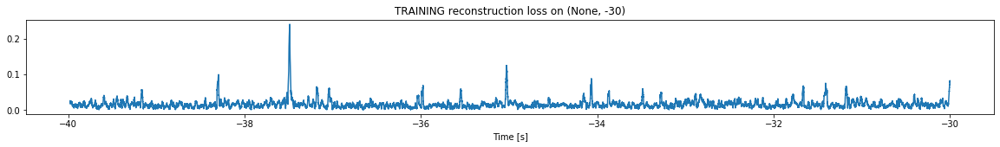

Finished training, median of the log(loss) is:  -1.8469758725446173
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


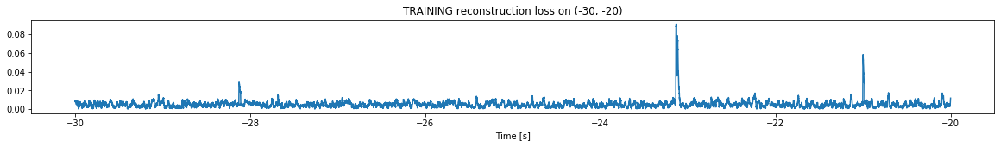

Finished training, median of the log(loss) is:  -2.3271821407380457
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8469758725446173
Triggering threshold is:  3.0


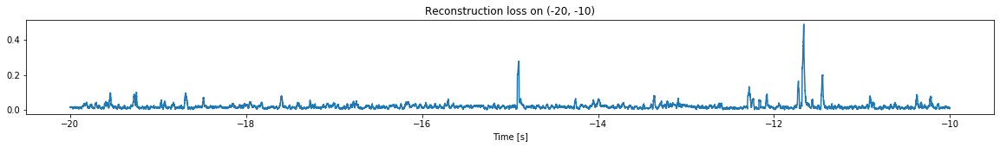

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


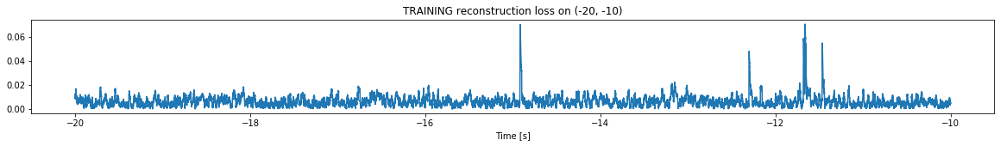

Finished training, median of the log(loss) is:  -2.2372897106219414
Triggering for section:  (-10, 0)
Using this median for triggering: -2.3271821407380457
Triggering threshold is:  1.6


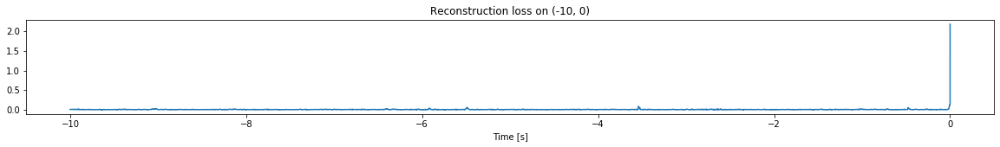

Other trigger time:  []
Their log loss values are:  []


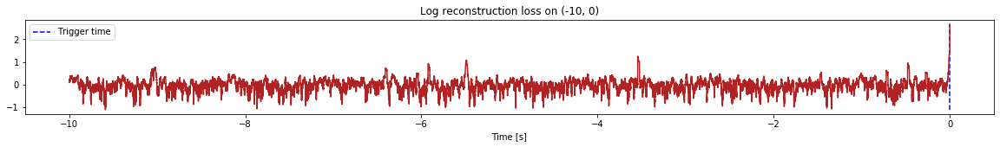

Triggered at:  []
Latent coordinates are:  []
<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [3]:
simulation("Ramp_14", "15T_data", 10,  time_range = (-40,0), reached_max = 4.0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


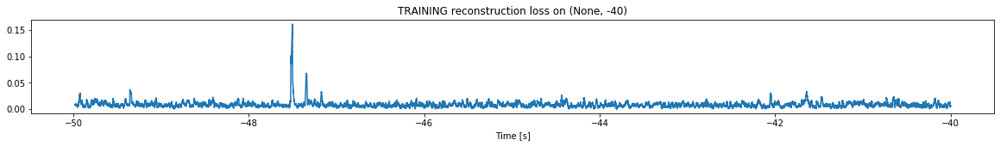

Finished training, median of the log(loss) is:  -2.1100840679437574
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


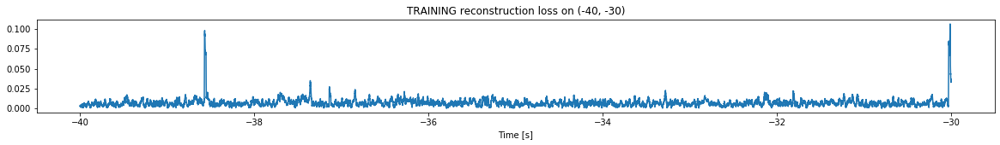

Finished training, median of the log(loss) is:  -2.188932306825698
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1100840679437574
Triggering threshold is:  3.0


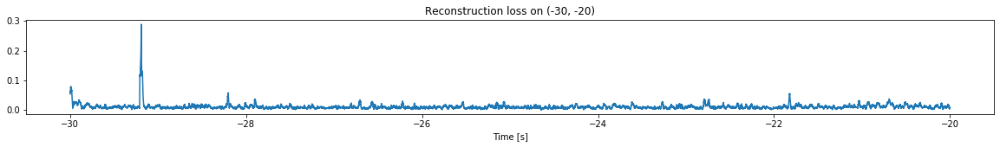

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


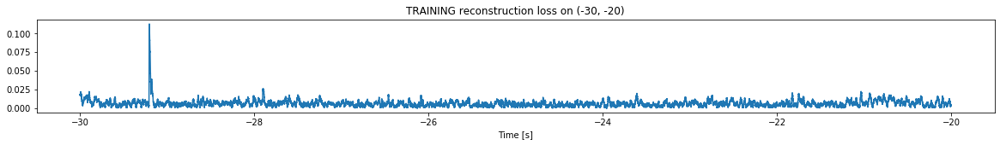

Finished training, median of the log(loss) is:  -2.2367256824087427
Triggering for section:  (-20, -10)
Using this median for triggering: -2.188932306825698
Triggering threshold is:  1.6


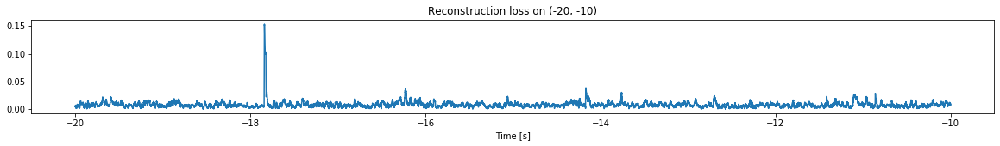

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


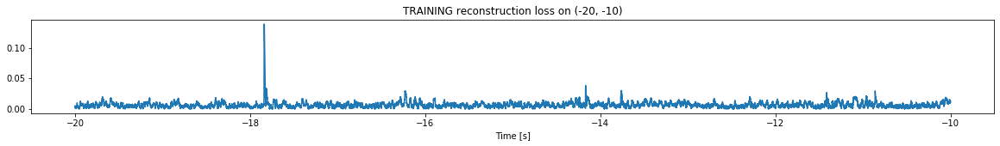

Finished training, median of the log(loss) is:  -2.2148536797845395
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2367256824087427
Triggering threshold is:  1.6


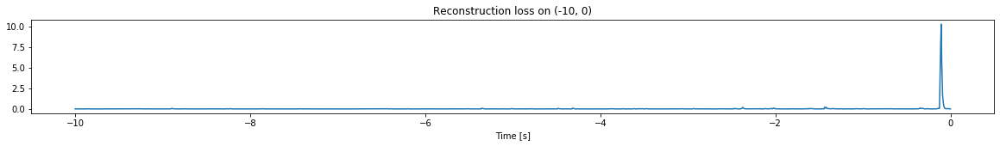

Other trigger time:  [-0.1059]
Their log loss values are:  [3.24982114]


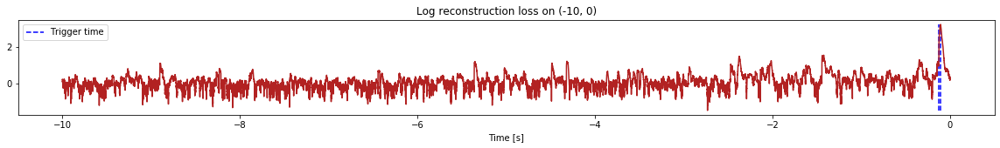

Triggered at:  [-0.1059]
Latent coordinates are:  [[17.933455, 47.37948]]
<--------
Finished simulation, all the triggered times are:  [-0.1059]

All latent coordinate:  [[17.933455, 47.37948]]


In [4]:
simulation("Ramp_15", "15T_data", 10,  time_range = (-50,0), reached_max = -4.55)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


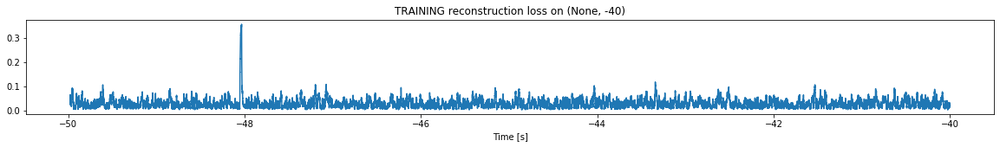

Finished training, median of the log(loss) is:  -1.623099532612677
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


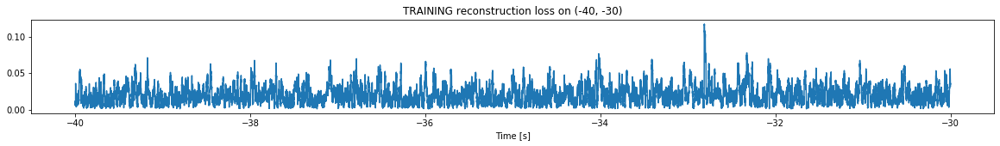

Finished training, median of the log(loss) is:  -1.7515391921402317
Triggering for section:  (-30, -20)
Using this median for triggering: -1.623099532612677
Triggering threshold is:  3.0


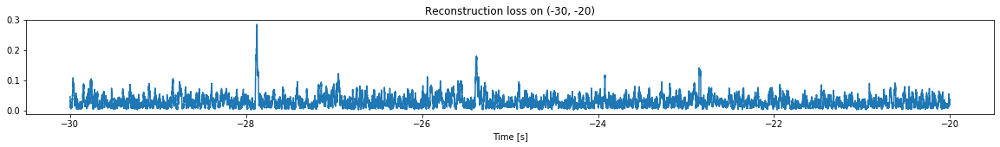

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


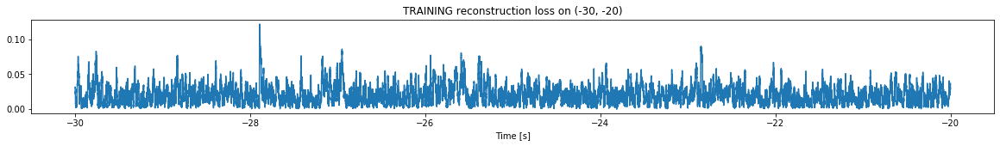

Finished training, median of the log(loss) is:  -1.7303684334058849
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7515391921402317
Triggering threshold is:  1.6


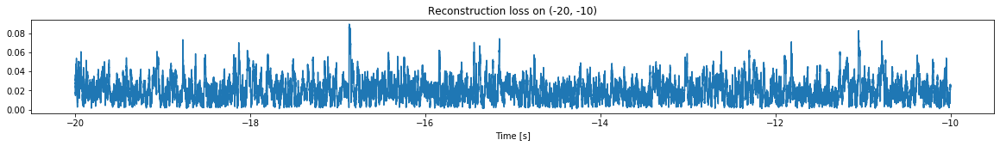

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


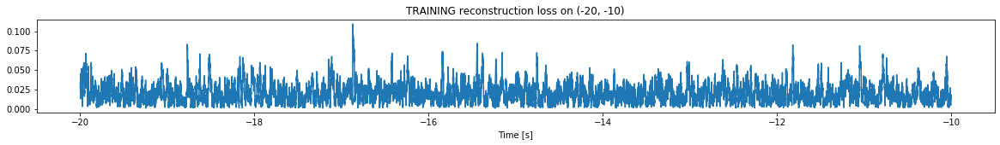

Finished training, median of the log(loss) is:  -1.7380578613166002
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7303684334058849
Triggering threshold is:  1.6


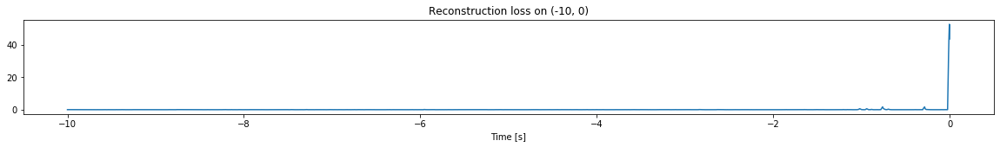

Other trigger time:  [-0.7596 -0.0035]
Their log loss values are:  [1.96689426 3.45366643]


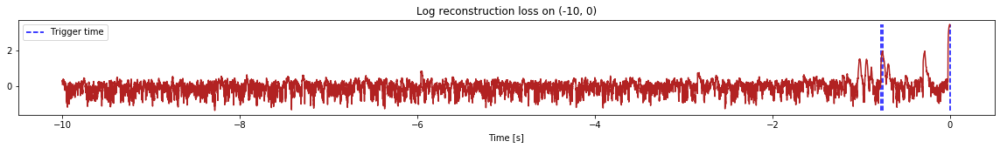

Triggered at:  [-0.7596, -0.0034999999]
Latent coordinates are:  [[2.2347717, 0.808059], [2.8611069, 0.6019905]]
<--------
Finished simulation, all the triggered times are:  [-0.7596, -0.0034999999]

All latent coordinate:  [[2.2347717, 0.808059], [2.8611069, 0.6019905]]


In [5]:
simulation("Ramp_17", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


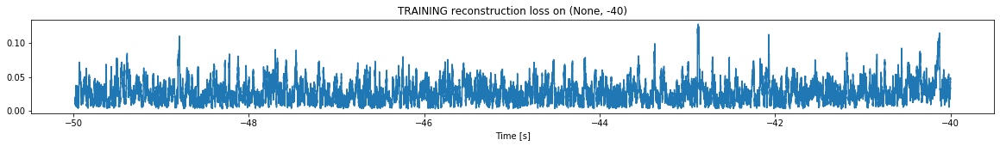

Finished training, median of the log(loss) is:  -1.6186183894003592
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


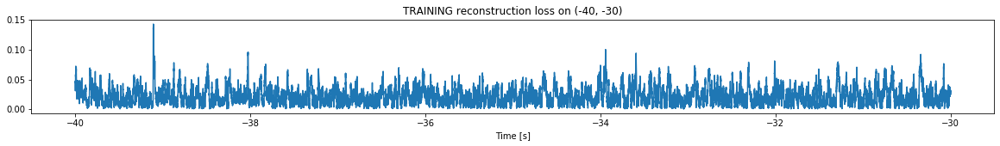

Finished training, median of the log(loss) is:  -1.71397084248455
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6186183894003592
Triggering threshold is:  3.0


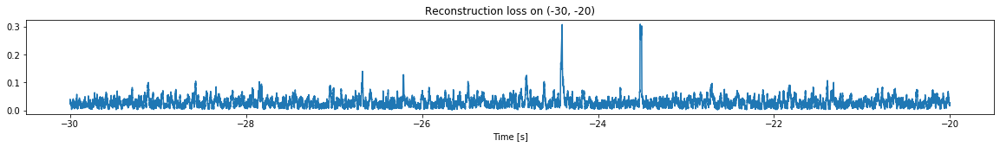

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


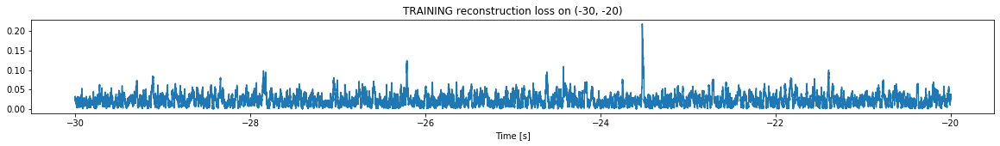

Finished training, median of the log(loss) is:  -1.692175800168286
Triggering for section:  (-20, -10)
Using this median for triggering: -1.71397084248455
Triggering threshold is:  1.6


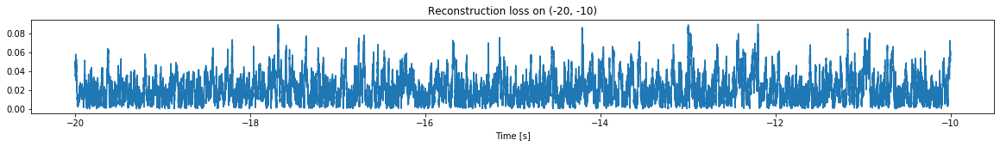

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


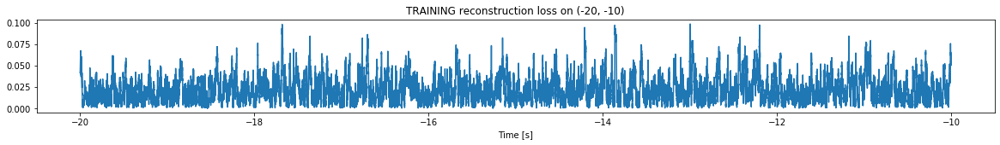

Finished training, median of the log(loss) is:  -1.7175977322902511
Triggering for section:  (-10, 0)
Using this median for triggering: -1.692175800168286
Triggering threshold is:  1.6


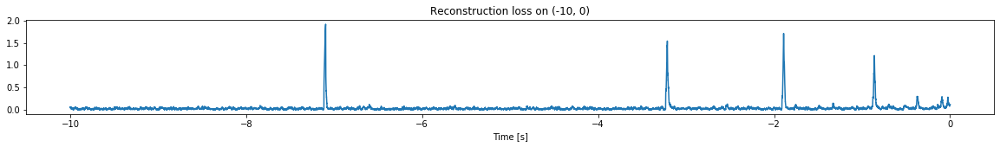

Other trigger time:  [-7.0965 -3.2136 -1.8919 -0.8609]
Their log loss values are:  [1.97481102 1.87978647 1.92528368 1.77657454]


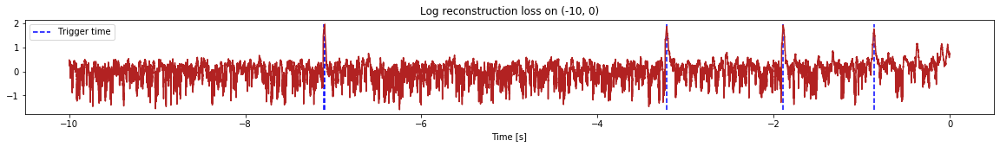

Triggered at:  [-7.0965, -3.2136, -1.8919, -0.8609]
Latent coordinates are:  [[0.94832164, -0.98365897], [-0.6559189, -0.976701], [-0.72158027, -0.98229456], [-0.32612997, -0.95843637]]
<--------
Finished simulation, all the triggered times are:  [-7.0965, -3.2136, -1.8919, -0.8609]

All latent coordinate:  [[0.94832164, -0.98365897], [-0.6559189, -0.976701], [-0.72158027, -0.98229456], [-0.32612997, -0.95843637]]


In [6]:
simulation("Ramp_18", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


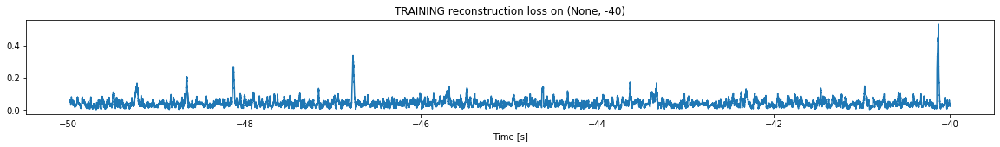

Finished training, median of the log(loss) is:  -1.4198158637470404
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


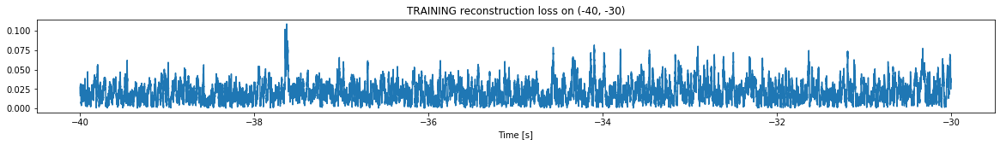

Finished training, median of the log(loss) is:  -1.7178343053251082
Triggering for section:  (-30, -20)
Using this median for triggering: -1.4198158637470404
Triggering threshold is:  3.0


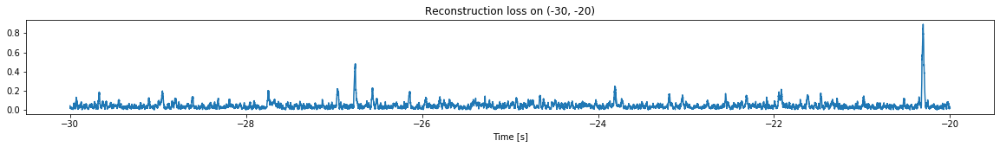

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


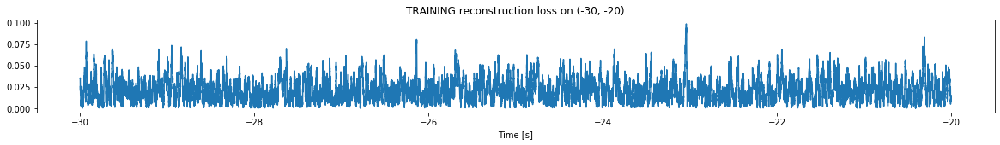

Finished training, median of the log(loss) is:  -1.7061302556733469
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7178343053251082
Triggering threshold is:  2.3


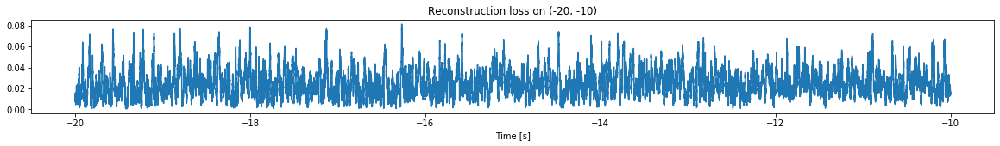

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


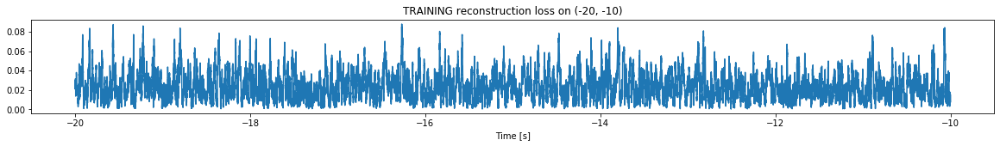

Finished training, median of the log(loss) is:  -1.6616079172644085
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7061302556733469
Triggering threshold is:  1.6


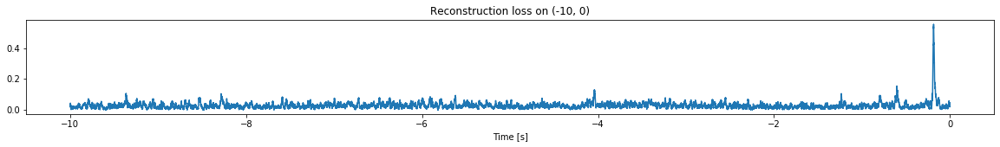

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [7]:
simulation("Ramp_20", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


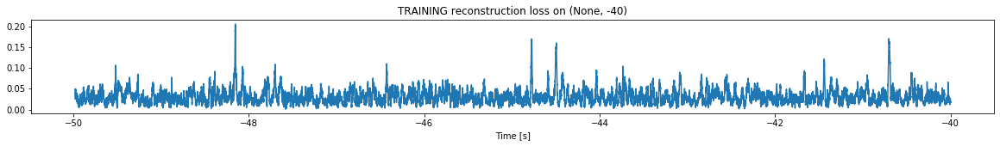

Finished training, median of the log(loss) is:  -1.5571131014352726
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


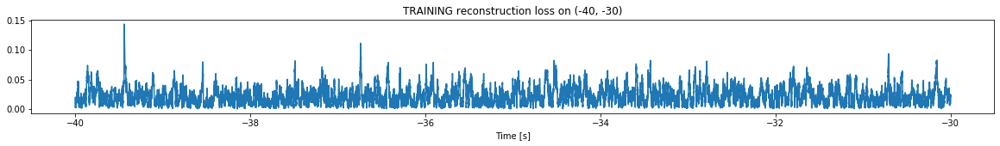

Finished training, median of the log(loss) is:  -1.714430138663937
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5571131014352726
Triggering threshold is:  3.0


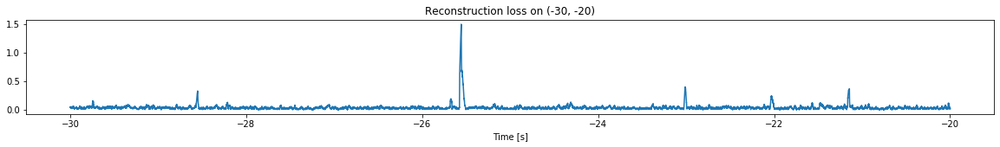

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


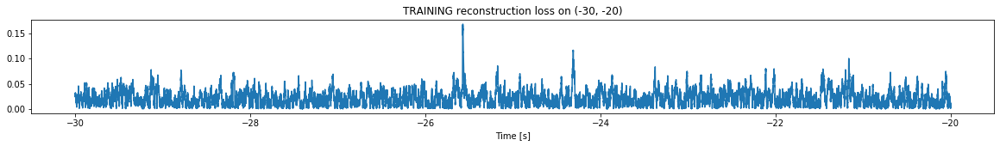

Finished training, median of the log(loss) is:  -1.722386282159284
Triggering for section:  (-20, -10)
Using this median for triggering: -1.714430138663937
Triggering threshold is:  1.6


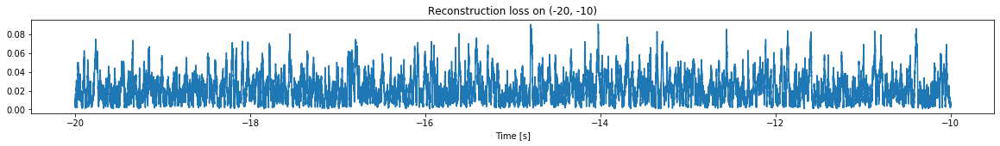

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


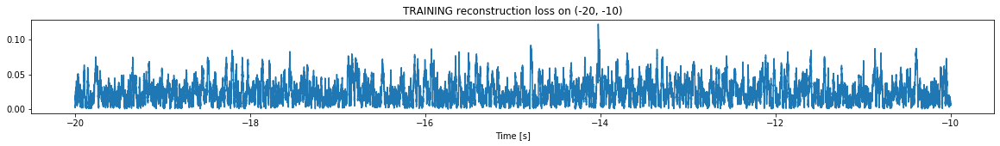

Finished training, median of the log(loss) is:  -1.6629010846710965
Triggering for section:  (-10, 0)
Using this median for triggering: -1.722386282159284
Triggering threshold is:  1.6


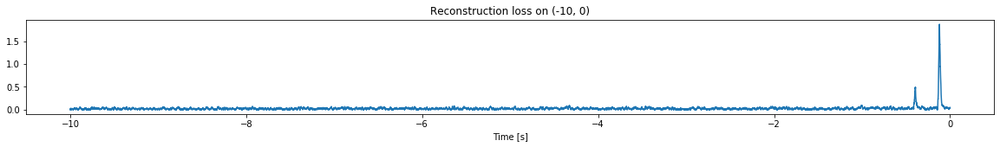

Other trigger time:  [-0.12109999]
Their log loss values are:  [1.99477132]


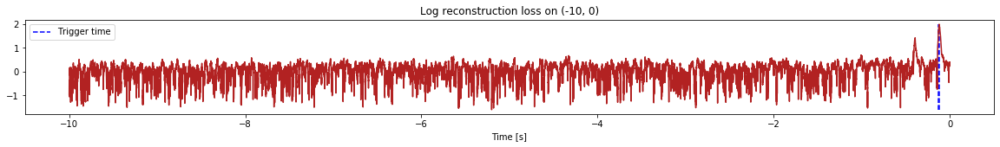

Triggered at:  [-0.12109999]
Latent coordinates are:  [[-0.62841547, -0.13927686]]
<--------
Finished simulation, all the triggered times are:  [-0.12109999]

All latent coordinate:  [[-0.62841547, -0.13927686]]


In [8]:
simulation("Ramp_21", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


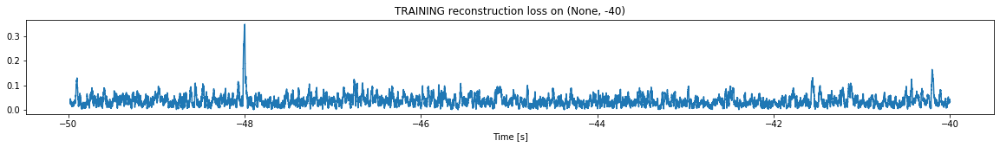

Finished training, median of the log(loss) is:  -1.4729543856912042
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


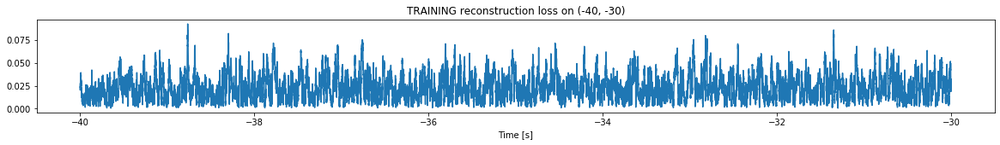

Finished training, median of the log(loss) is:  -1.685022627641041
Triggering for section:  (-30, -20)
Using this median for triggering: -1.4729543856912042
Triggering threshold is:  3.0


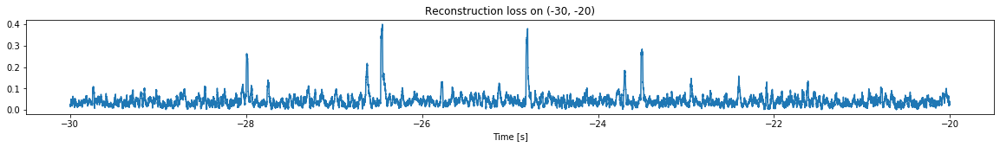

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


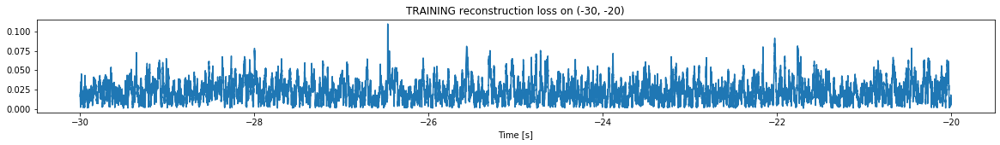

Finished training, median of the log(loss) is:  -1.689149813184633
Triggering for section:  (-20, -10)
Using this median for triggering: -1.685022627641041
Triggering threshold is:  1.6


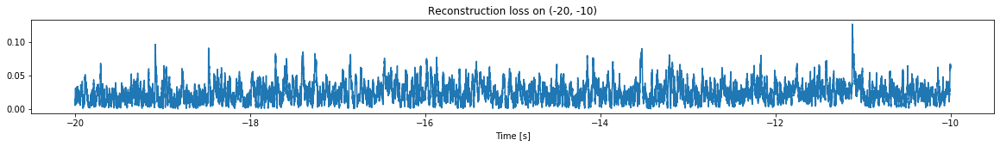

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


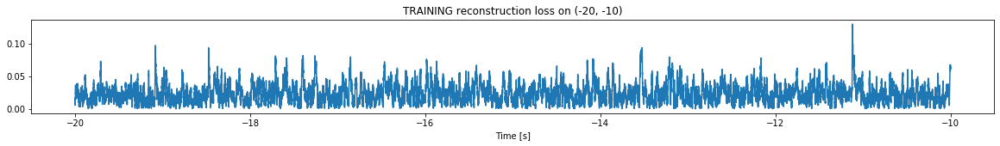

Finished training, median of the log(loss) is:  -1.6628791160979037
Triggering for section:  (-10, 0)
Using this median for triggering: -1.689149813184633
Triggering threshold is:  1.6


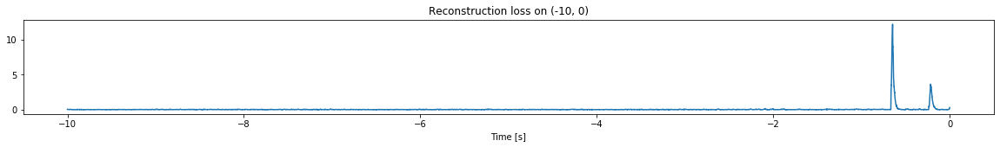

Other trigger time:  [-0.6466]
Their log loss values are:  [2.77600557]


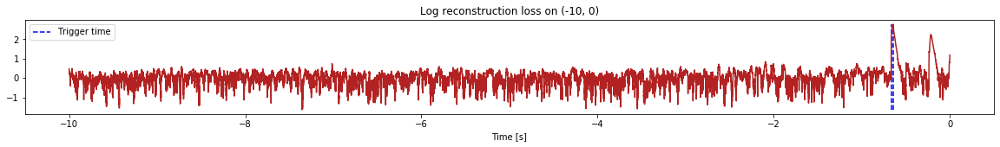

Triggered at:  [-0.6466]
Latent coordinates are:  [[12.554453, 12.879038]]
<--------
Finished simulation, all the triggered times are:  [-0.6466]

All latent coordinate:  [[12.554453, 12.879038]]


In [9]:
simulation("Ramp_22", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

-----

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


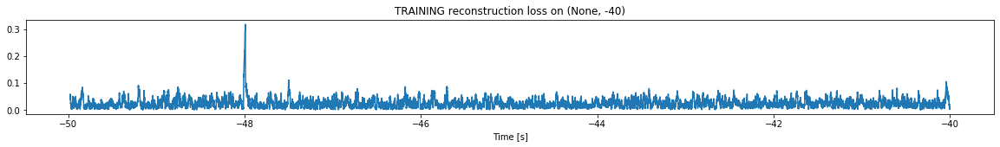

Finished training, median of the log(loss) is:  -1.6560451773523008
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


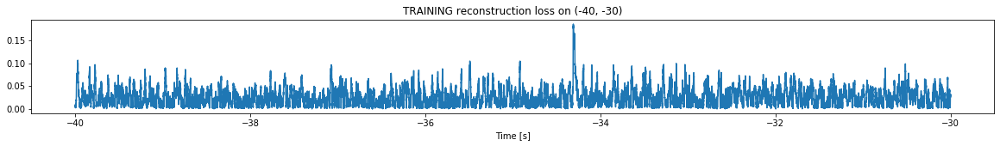

Finished training, median of the log(loss) is:  -1.6606516942848448
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6560451773523008
Triggering threshold is:  3.0


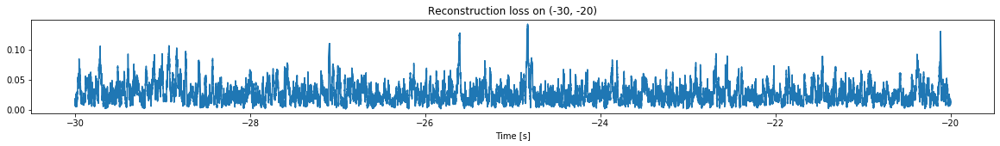

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


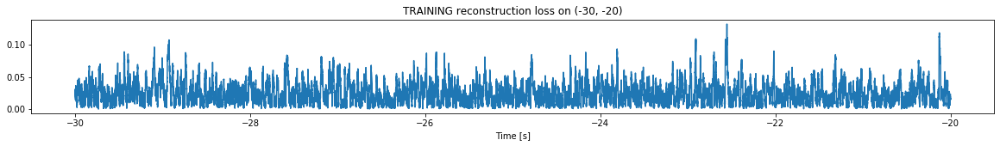

Finished training, median of the log(loss) is:  -1.6700473745208078
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6606516942848448
Triggering threshold is:  1.6


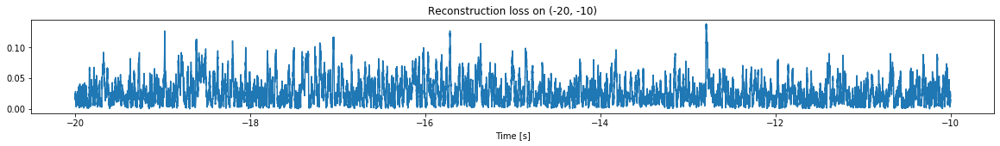

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


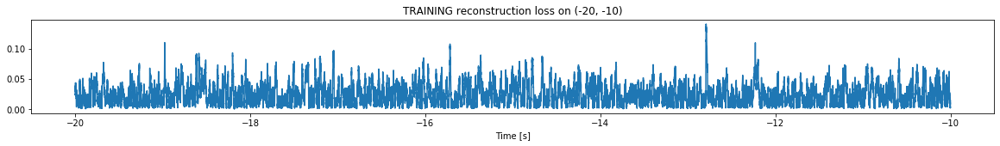

Finished training, median of the log(loss) is:  -1.667635327327
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6700473745208078
Triggering threshold is:  1.6


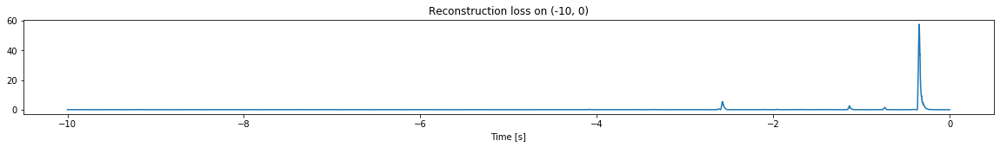

Other trigger time:  [-2.5769 -1.135  -0.3451]
Their log loss values are:  [2.40678727 2.08776824 3.43177921]


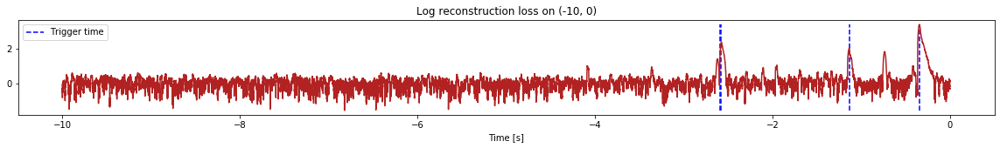

Triggered at:  [-2.5769, -1.135, -0.3451]
Latent coordinates are:  [[0.38248467, -0.9229704], [1.0923266, -0.6419524], [-0.999894, -1.0]]
<--------
Finished simulation, all the triggered times are:  [-2.5769, -1.135, -0.3451]

All latent coordinate:  [[0.38248467, -0.9229704], [1.0923266, -0.6419524], [-0.999894, -1.0]]


In [10]:
simulation("Ramp_23", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


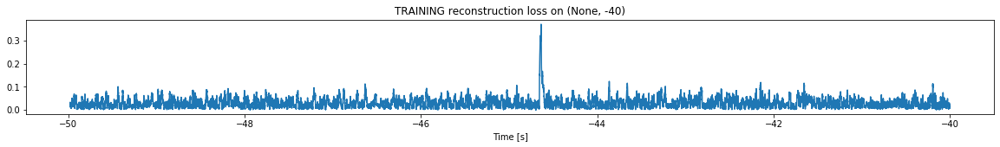

Finished training, median of the log(loss) is:  -1.5996836136939188
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


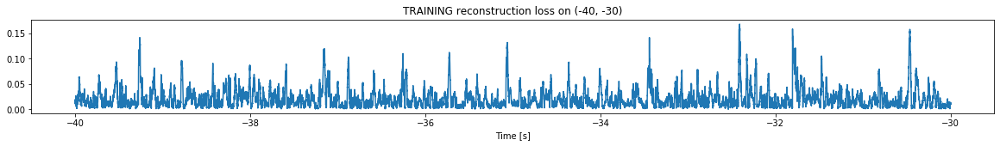

Finished training, median of the log(loss) is:  -1.8089678055532188
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5996836136939188
Triggering threshold is:  3.0


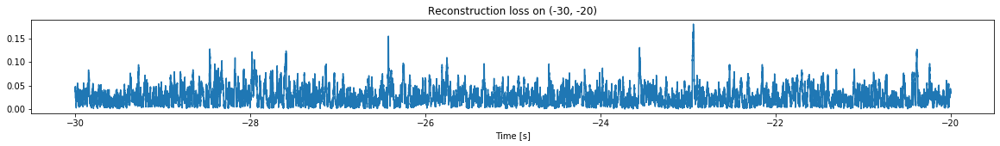

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


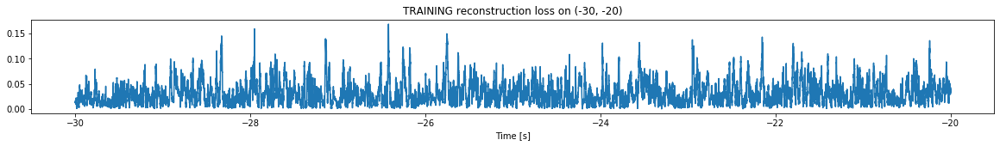

Finished training, median of the log(loss) is:  -1.5910534988969864
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8089678055532188
Triggering threshold is:  2.3


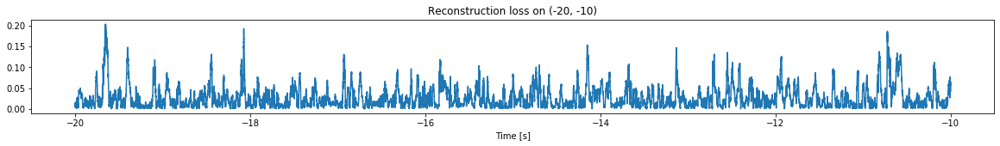

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


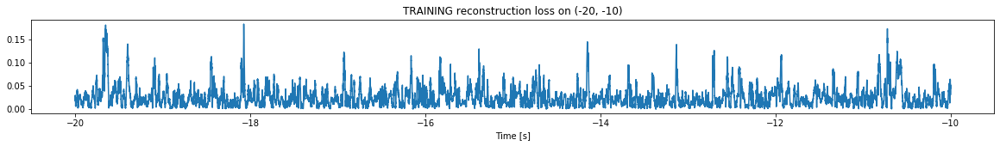

Finished training, median of the log(loss) is:  -1.68795137581817
Triggering for section:  (-10, 0)
Using this median for triggering: -1.5910534988969864
Triggering threshold is:  1.6


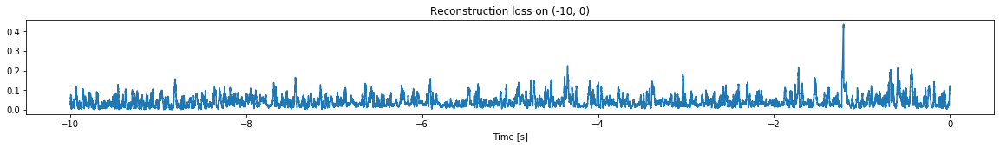

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [11]:
simulation("Ramp_24", "15T_data", 10,  time_range = (-50,0), reached_max = 1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


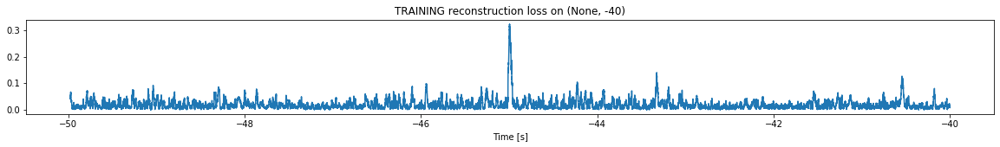

Finished training, median of the log(loss) is:  -1.8494680157444967
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


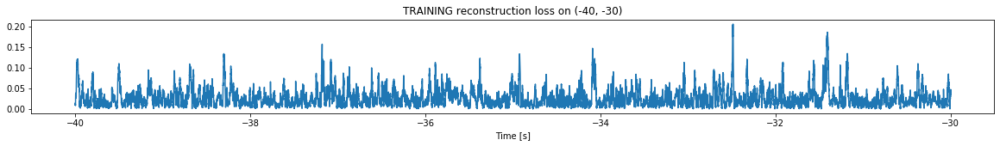

Finished training, median of the log(loss) is:  -1.6776460325731004
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8494680157444967
Triggering threshold is:  3.0


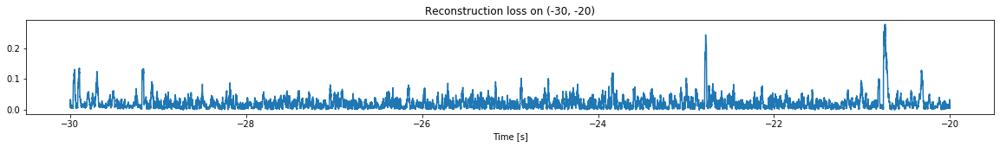

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


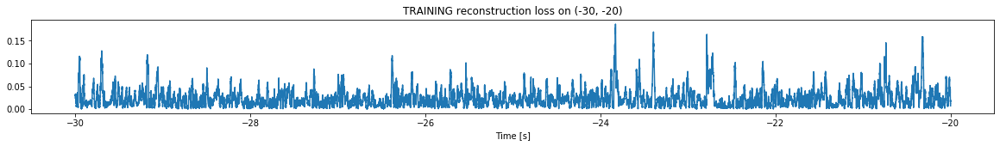

Finished training, median of the log(loss) is:  -1.726882665744769
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6776460325731004
Triggering threshold is:  1.6


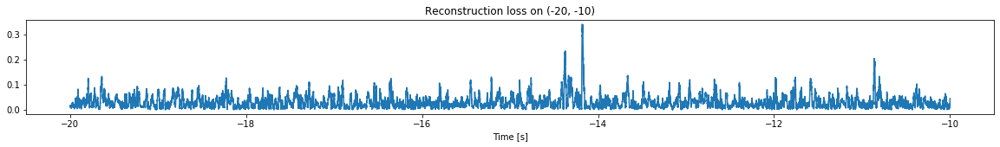

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


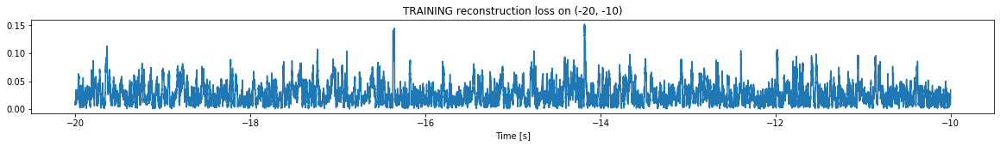

Finished training, median of the log(loss) is:  -1.6419800251215224
Triggering for section:  (-10, 0)
Using this median for triggering: -1.726882665744769
Triggering threshold is:  1.6


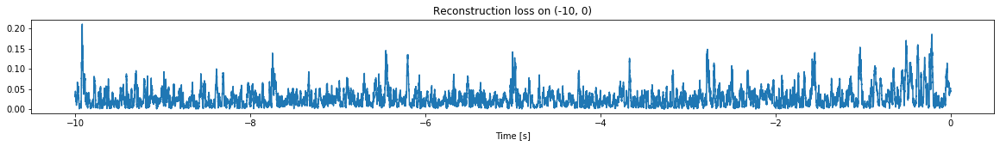

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [12]:
simulation("Ramp_25", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


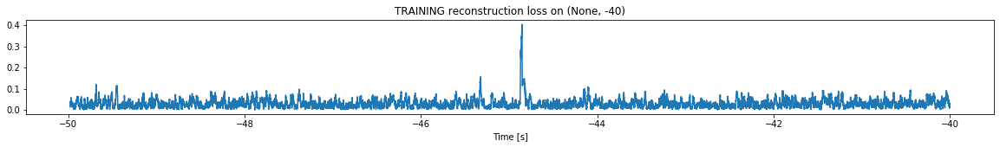

Finished training, median of the log(loss) is:  -1.6057296552204054
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


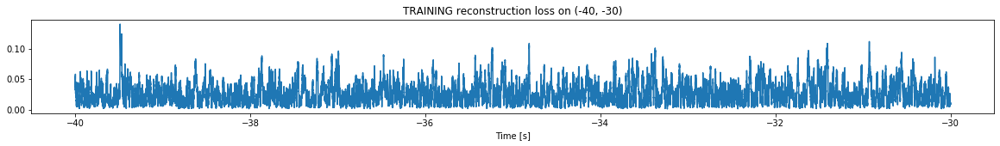

Finished training, median of the log(loss) is:  -1.6382883516561844
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6057296552204054
Triggering threshold is:  3.0


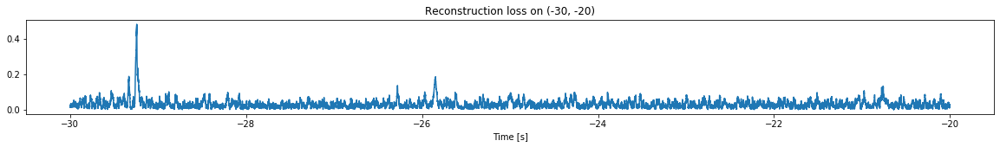

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


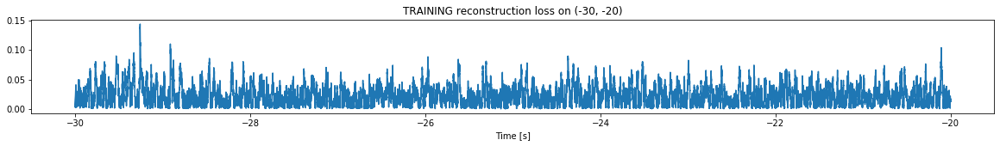

Finished training, median of the log(loss) is:  -1.7067408484059707
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6382883516561844
Triggering threshold is:  1.6


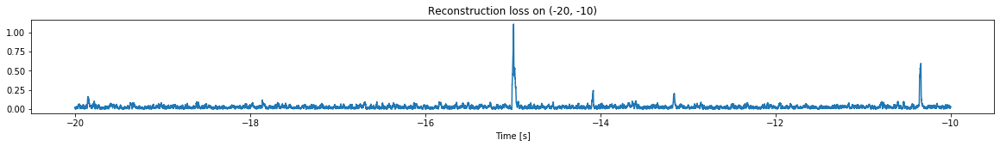

Other trigger time:  [-14.9915]
Their log loss values are:  [1.68453551]


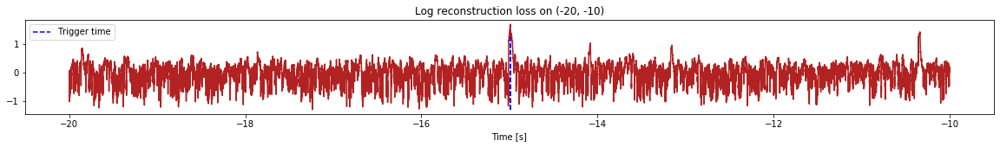

Triggered at:  [-14.9915]
Latent coordinates are:  [[-0.84165895, 1.8500984]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


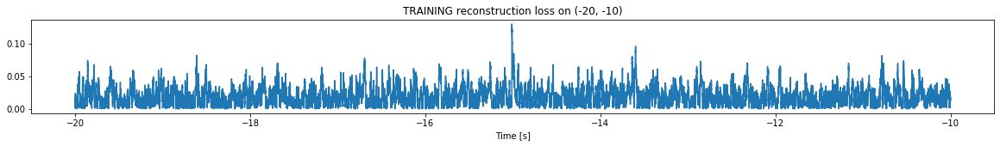

Finished training, median of the log(loss) is:  -1.7644830299566225
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7067408484059707
Triggering threshold is:  1.6


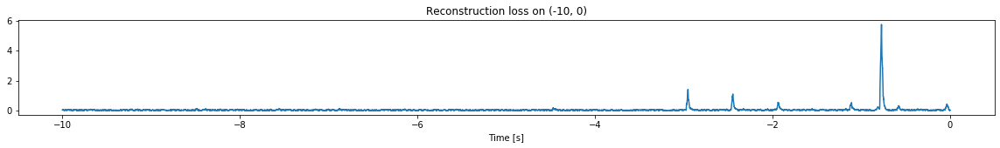

Other trigger time:  [-2.952  -2.4463 -0.7721]
Their log loss values are:  [1.85469214 1.74686994 2.46676238]


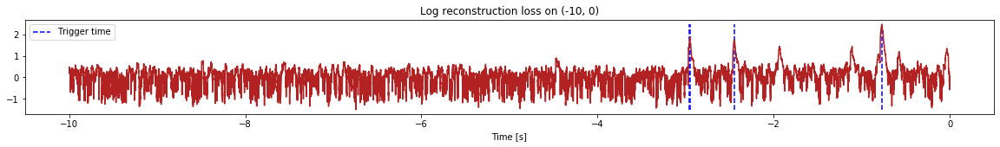

Triggered at:  [-2.952, -2.4463, -0.7721]
Latent coordinates are:  [[-0.82401854, 2.7146842], [-0.9436044, 0.32718208], [-0.97833556, 10.22037]]
<--------
Finished simulation, all the triggered times are:  [-14.9915, -2.952, -2.4463, -0.7721]

All latent coordinate:  [[-0.84165895, 1.8500984], [-0.82401854, 2.7146842], [-0.9436044, 0.32718208], [-0.97833556, 10.22037]]


In [13]:
simulation("Ramp_27", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


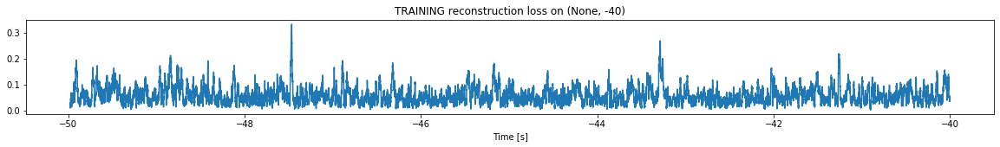

Finished training, median of the log(loss) is:  -1.2911181946728922
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


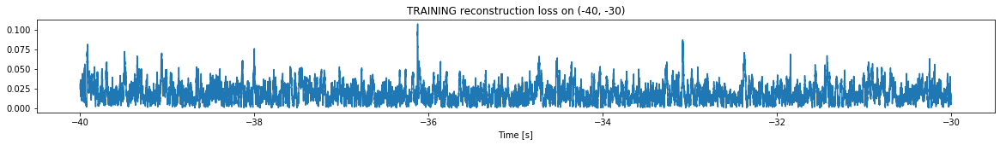

Finished training, median of the log(loss) is:  -1.7682934692443457
Triggering for section:  (-30, -20)
Using this median for triggering: -1.2911181946728922
Triggering threshold is:  3.0


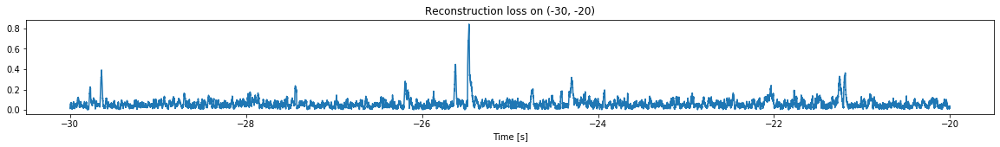

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


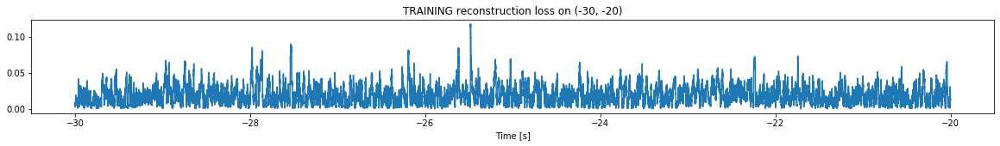

Finished training, median of the log(loss) is:  -1.7637778701023468
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7682934692443457
Triggering threshold is:  2.3


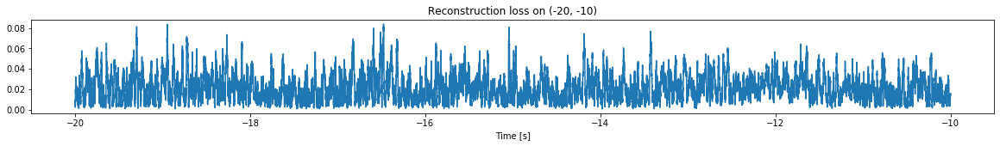

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


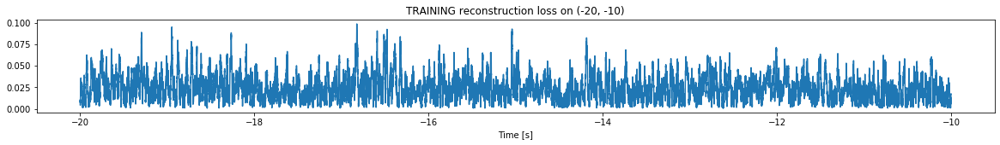

Finished training, median of the log(loss) is:  -1.6647271829177908
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7637778701023468
Triggering threshold is:  1.6


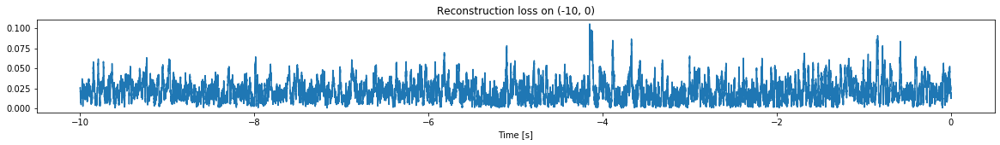

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [14]:
simulation("Ramp_28", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


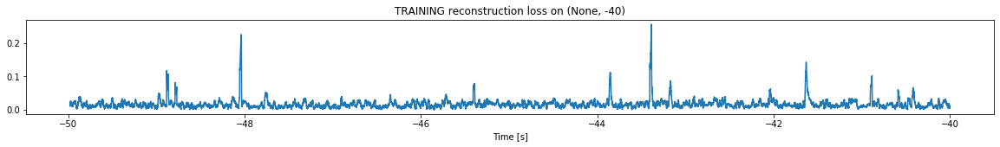

Finished training, median of the log(loss) is:  -1.8334600355251898
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


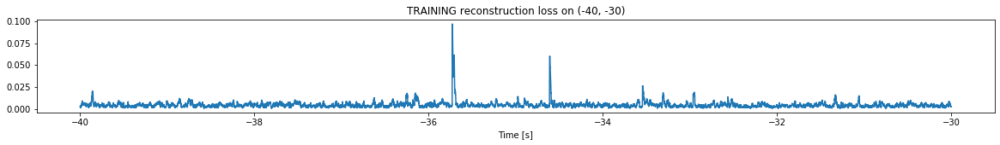

Finished training, median of the log(loss) is:  -2.421130500546852
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8334600355251898
Triggering threshold is:  3.0


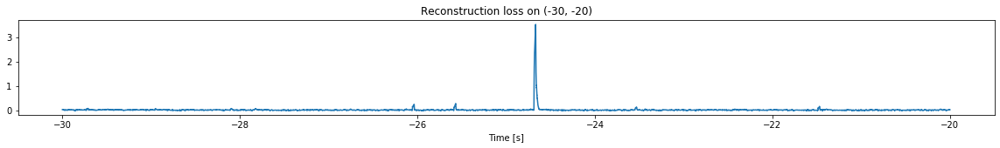

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


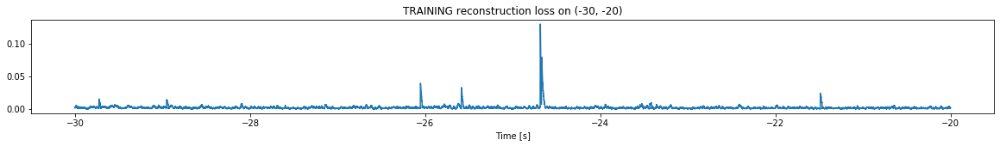

Finished training, median of the log(loss) is:  -2.751196318102539
Triggering for section:  (-20, -10)
Using this median for triggering: -2.421130500546852
Triggering threshold is:  1.6


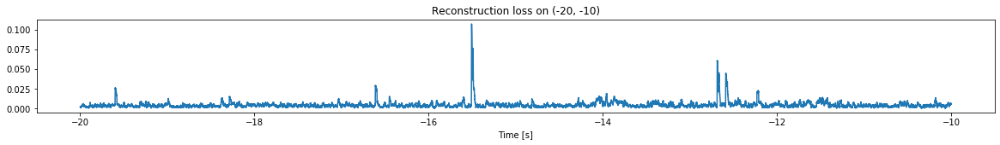

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


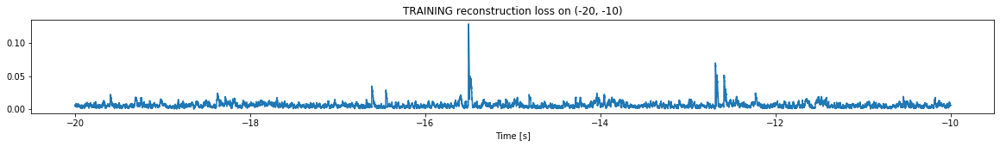

Finished training, median of the log(loss) is:  -2.2829437658824534
Triggering for section:  (-10, 0)
Using this median for triggering: -2.751196318102539
Triggering threshold is:  1.6


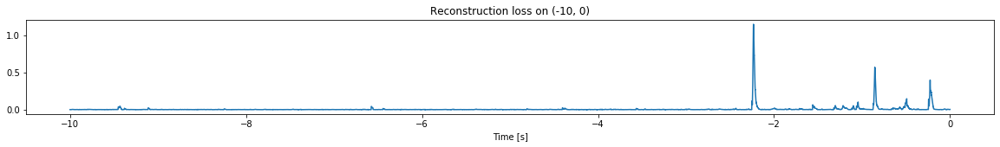

Other trigger time:  [-2.2337 -0.8545 -0.226 ]
Their log loss values are:  [2.81287609 2.5089963  2.35318708]


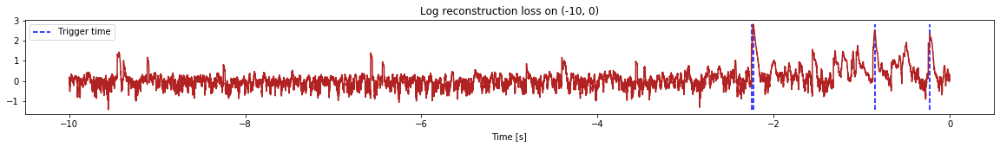

Triggered at:  [-2.2337, -0.8545, -0.226]
Latent coordinates are:  [[6.2046943, 1.4029639], [3.1623101, 0.9371952], [2.7987232, 0.04366821]]
<--------
Finished simulation, all the triggered times are:  [-2.2337, -0.8545, -0.226]

All latent coordinate:  [[6.2046943, 1.4029639], [3.1623101, 0.9371952], [2.7987232, 0.04366821]]


In [15]:
simulation("Ramp_29", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


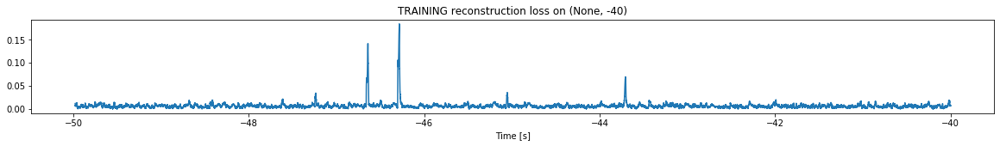

Finished training, median of the log(loss) is:  -2.2121366519300496
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


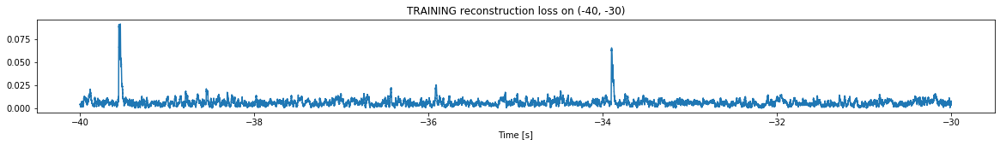

Finished training, median of the log(loss) is:  -2.2499765781037695
Triggering for section:  (-30, -20)
Using this median for triggering: -2.2121366519300496
Triggering threshold is:  3.0


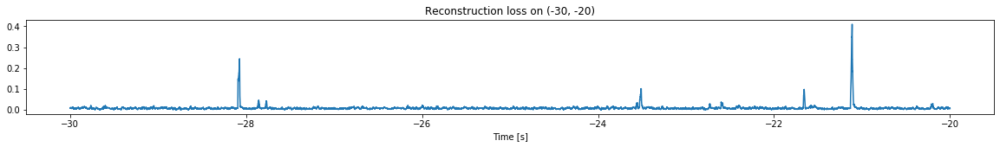

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


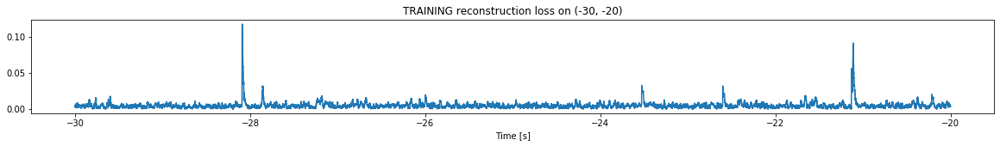

Finished training, median of the log(loss) is:  -2.366725494846545
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2499765781037695
Triggering threshold is:  1.6


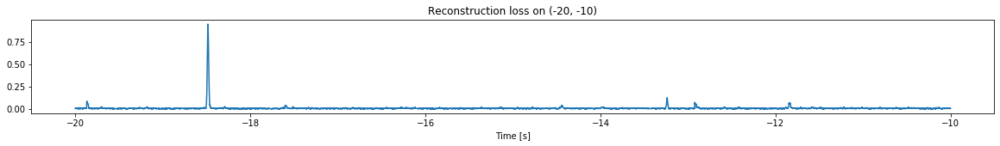

Other trigger time:  [-18.483799]
Their log loss values are:  [2.22705872]


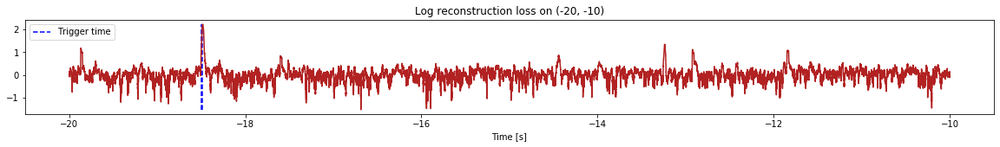

Triggered at:  [-18.483799]
Latent coordinates are:  [[-0.8120339, 1.9073837]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


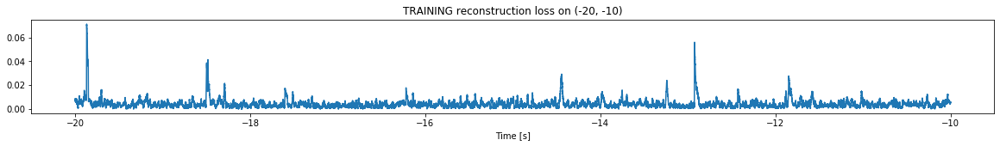

Finished training, median of the log(loss) is:  -2.443502490805415
Triggering for section:  (-10, 0)
Using this median for triggering: -2.366725494846545
Triggering threshold is:  1.6


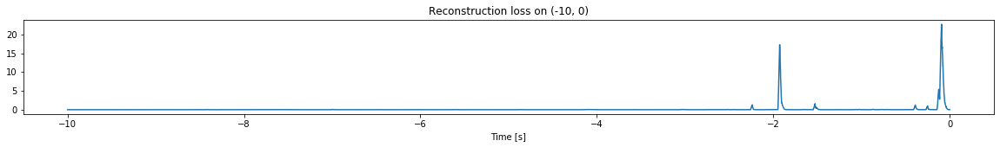

Other trigger time:  [-1.9281 -0.0935]
Their log loss values are:  [3.60417531 3.72290037]


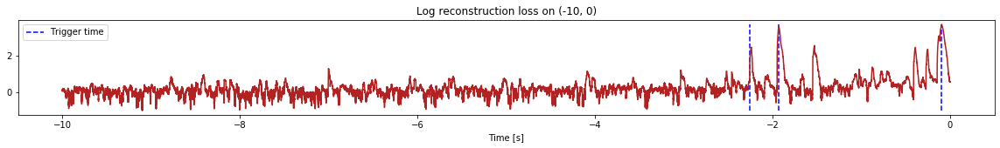

Triggered at:  [-1.9281, -0.093499996]
Latent coordinates are:  [[-0.99999994, -0.9416907], [-1.0, -0.9614081]]
<--------
Finished simulation, all the triggered times are:  [-18.483799, -1.9281, -0.093499996]

All latent coordinate:  [[-0.8120339, 1.9073837], [-0.99999994, -0.9416907], [-1.0, -0.9614081]]


In [16]:
simulation("Ramp_30", "15T_data", 10,  time_range = (-50,0), reached_max = -3)

----------

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


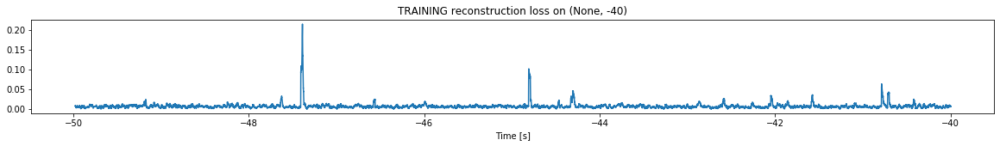

Finished training, median of the log(loss) is:  -2.1923060284432982
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


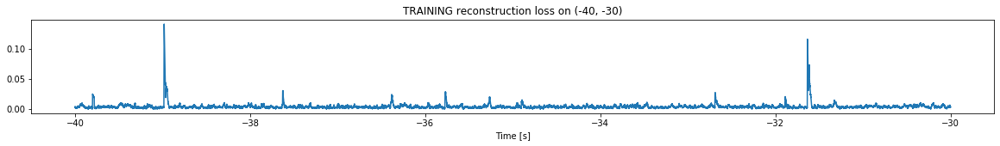

Finished training, median of the log(loss) is:  -2.4677121628791943
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1923060284432982
Triggering threshold is:  3.0


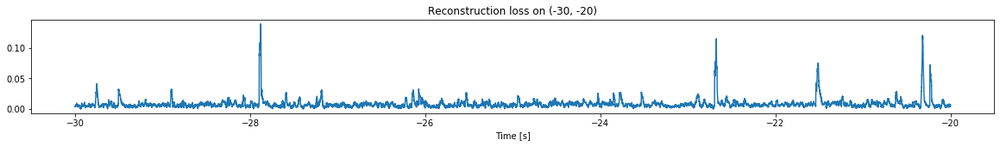

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


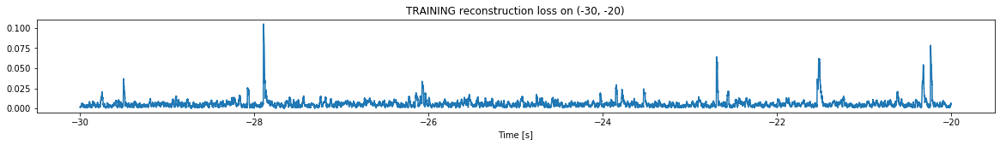

Finished training, median of the log(loss) is:  -2.338526209749863
Triggering for section:  (-20, -10)
Using this median for triggering: -2.4677121628791943
Triggering threshold is:  1.6


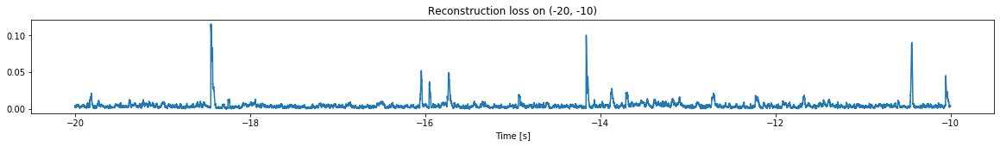

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


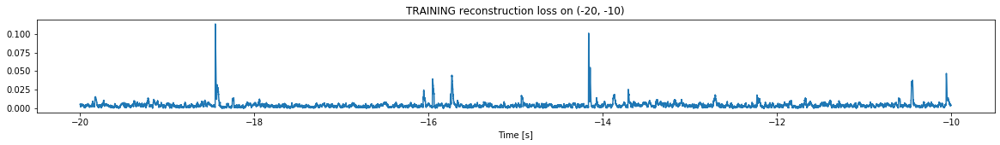

Finished training, median of the log(loss) is:  -2.4546623405704073
Triggering for section:  (-10, 0)
Using this median for triggering: -2.338526209749863
Triggering threshold is:  1.6


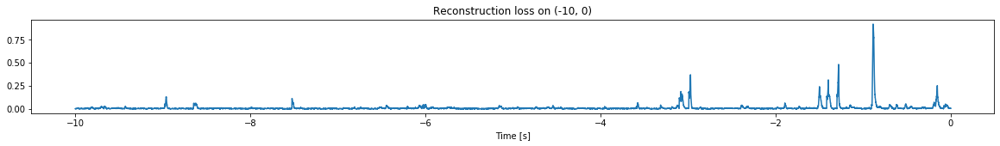

Other trigger time:  [-2.9710999 -1.3965    -0.8849    -0.1519   ]
Their log loss values are:  [1.90898126 1.83814043 2.30297268 1.74182245]


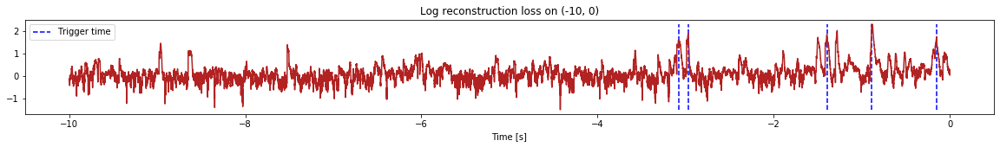

Triggered at:  [-2.9710999, -1.3965, -0.8849, -0.1519]
Latent coordinates are:  [[-0.7752537, -0.6602142], [-0.81309485, -0.58346343], [-0.9356937, -0.8079185], [-0.5026275, -0.56086123]]
<--------
Finished simulation, all the triggered times are:  [-2.9710999, -1.3965, -0.8849, -0.1519]

All latent coordinate:  [[-0.7752537, -0.6602142], [-0.81309485, -0.58346343], [-0.9356937, -0.8079185], [-0.5026275, -0.56086123]]


In [17]:
simulation("Ramp_31", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


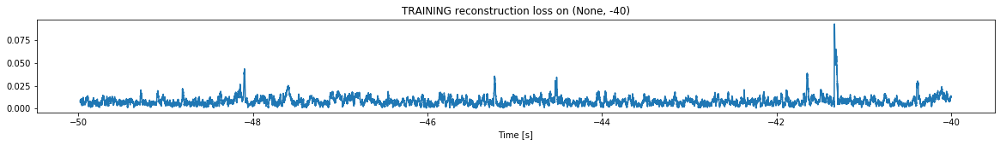

Finished training, median of the log(loss) is:  -2.1368276555844514
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


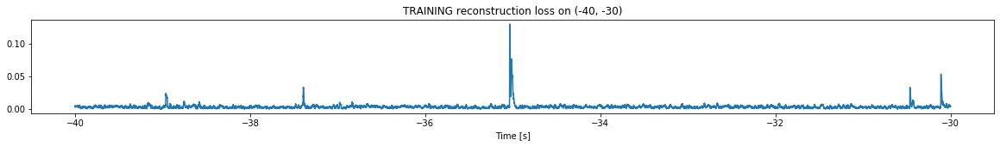

Finished training, median of the log(loss) is:  -2.5197853460544346
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1368276555844514
Triggering threshold is:  3.0


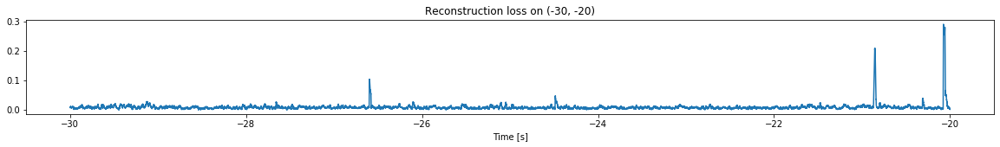

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


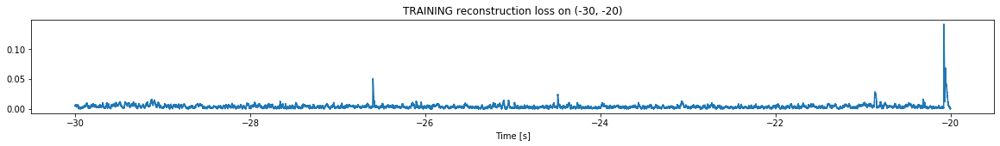

Finished training, median of the log(loss) is:  -2.4410074486982487
Triggering for section:  (-20, -10)
Using this median for triggering: -2.5197853460544346
Triggering threshold is:  1.6


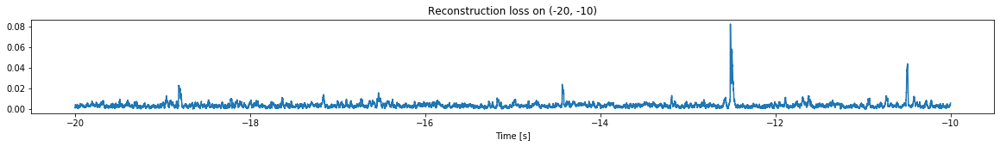

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


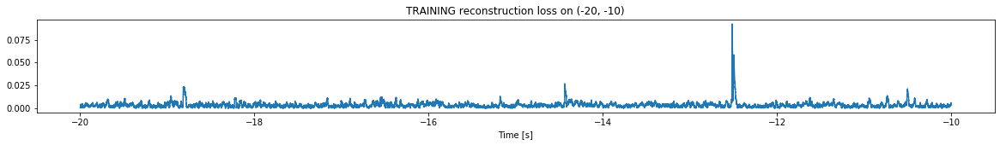

Finished training, median of the log(loss) is:  -2.5155001302417466
Triggering for section:  (-10, 0)
Using this median for triggering: -2.4410074486982487
Triggering threshold is:  1.6


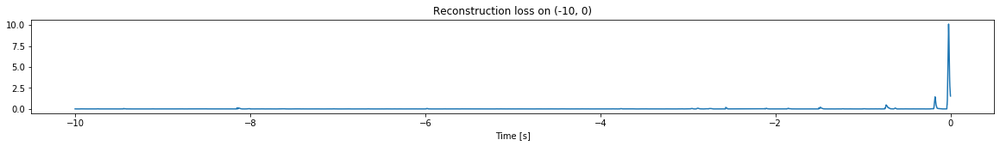

Other trigger time:  [-2.5678 -1.4856 -0.7345 -0.0213]
Their log loss values are:  [1.71339613 1.77975734 2.12281042 3.44639737]


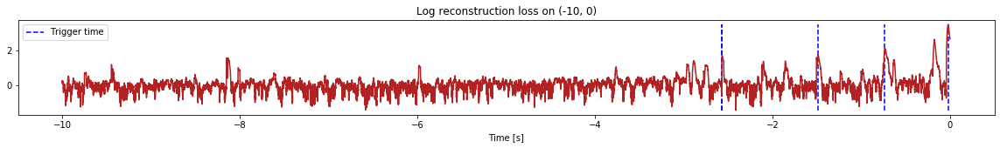

Triggered at:  [-2.5678, -1.4856, -0.7345, -0.0213]
Latent coordinates are:  [[1.228987, -0.002067864], [4.4481134, 1.9767237], [6.14351, 2.492325], [76.24585, 27.478695]]
<--------
Finished simulation, all the triggered times are:  [-2.5678, -1.4856, -0.7345, -0.0213]

All latent coordinate:  [[1.228987, -0.002067864], [4.4481134, 1.9767237], [6.14351, 2.492325], [76.24585, 27.478695]]


In [18]:
simulation("Ramp_32", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


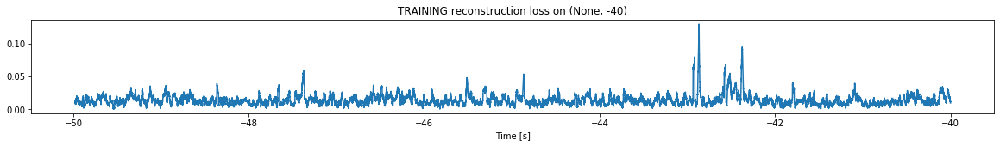

Finished training, median of the log(loss) is:  -1.8937583487244045
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


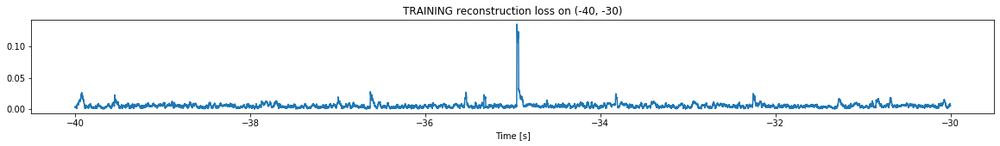

Finished training, median of the log(loss) is:  -2.2914834378210287
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8937583487244045
Triggering threshold is:  3.0


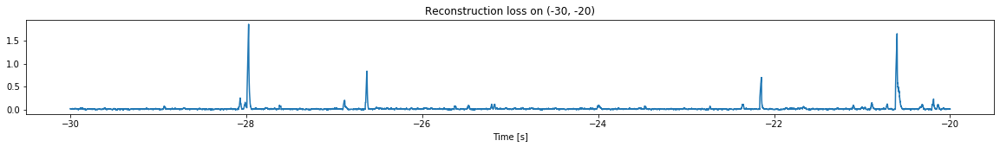

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


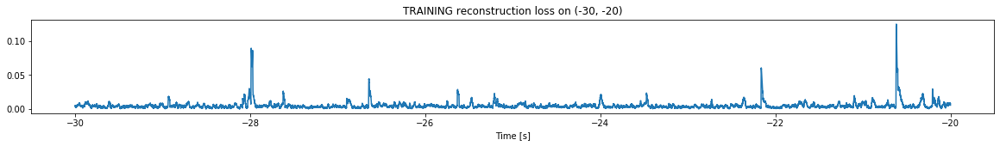

Finished training, median of the log(loss) is:  -2.383415663405581
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2914834378210287
Triggering threshold is:  1.6


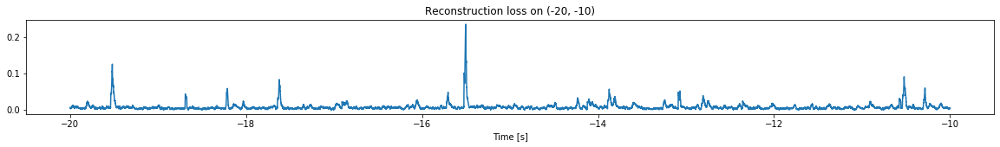

Other trigger time:  [-15.5042]
Their log loss values are:  [1.66400132]


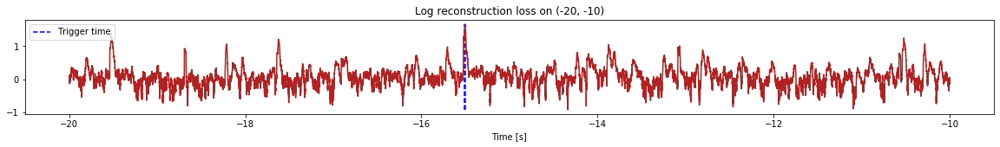

Triggered at:  [-15.5042]
Latent coordinates are:  [[1.0352519, 2.1393125]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


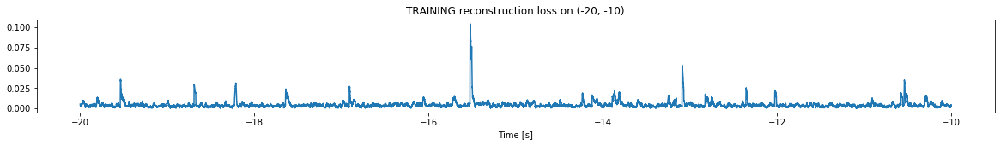

Finished training, median of the log(loss) is:  -2.420993031663462
Triggering for section:  (-10, 0)
Using this median for triggering: -2.383415663405581
Triggering threshold is:  1.6


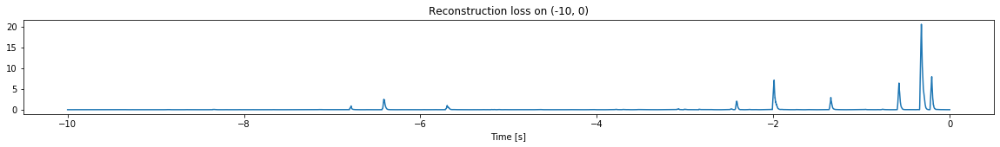

Other trigger time:  [-6.415      -5.6965     -3.0712     -1.9908999  -1.3476     -0.32209998]
Their log loss values are:  [2.77351125 2.38794863 1.73545374 3.23695603 2.85217036 3.69739203]


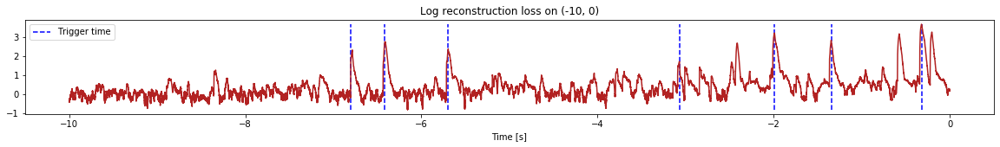

Triggered at:  [-6.415, -5.6965, -3.0712, -1.9908999, -1.3476, -0.32209998]
Latent coordinates are:  [[1.6283246, 3.2158988], [1.5206313, 2.8753402], [1.0433578, 2.311912], [1.4517214, 3.6701934], [1.7203689, 3.116259], [1.818968, 3.1243236]]
<--------
Finished simulation, all the triggered times are:  [-15.5042, -6.415, -5.6965, -3.0712, -1.9908999, -1.3476, -0.32209998]

All latent coordinate:  [[1.0352519, 2.1393125], [1.6283246, 3.2158988], [1.5206313, 2.8753402], [1.0433578, 2.311912], [1.4517214, 3.6701934], [1.7203689, 3.116259], [1.818968, 3.1243236]]


In [19]:
simulation("Ramp_33", "15T_data", 10,  time_range = (-50,0), reached_max = -3)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


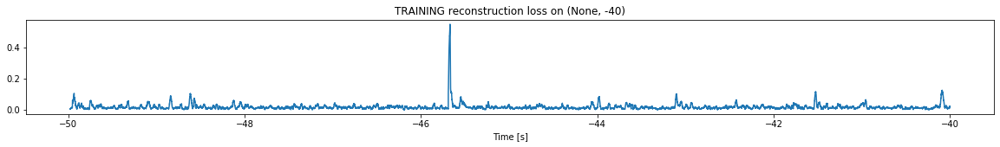

Finished training, median of the log(loss) is:  -1.851078009794248
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


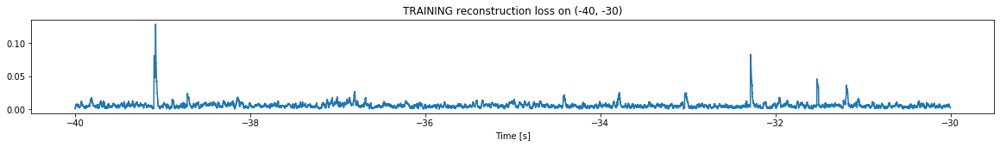

Finished training, median of the log(loss) is:  -2.271505499938364
Triggering for section:  (-30, -20)
Using this median for triggering: -1.851078009794248
Triggering threshold is:  3.0


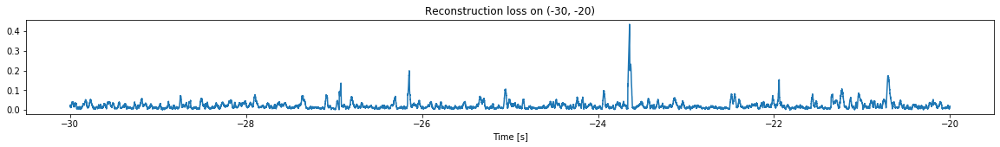

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


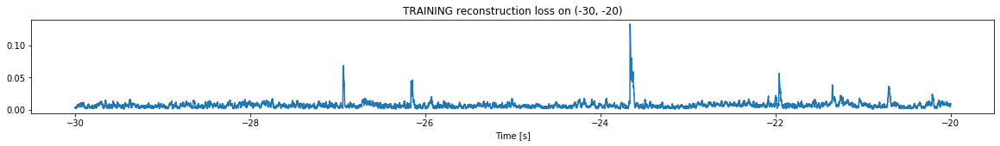

Finished training, median of the log(loss) is:  -2.212364460441783
Triggering for section:  (-20, -10)
Using this median for triggering: -2.271505499938364
Triggering threshold is:  2.3


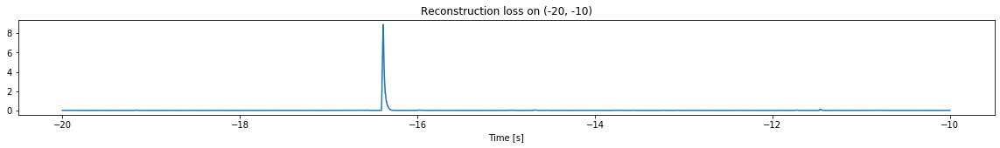

Other trigger time:  [-16.3844]
Their log loss values are:  [3.22200265]


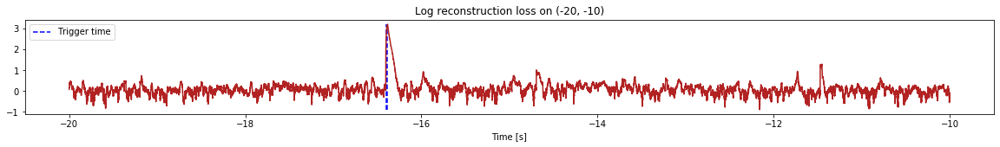

Triggered at:  [-16.3844]
Latent coordinates are:  [[-0.9613982, -0.9999998]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


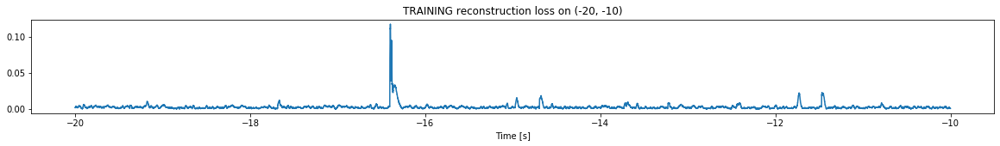

Finished training, median of the log(loss) is:  -2.656858158525593
Triggering for section:  (-10, 0)
Using this median for triggering: -2.212364460441783
Triggering threshold is:  1.6


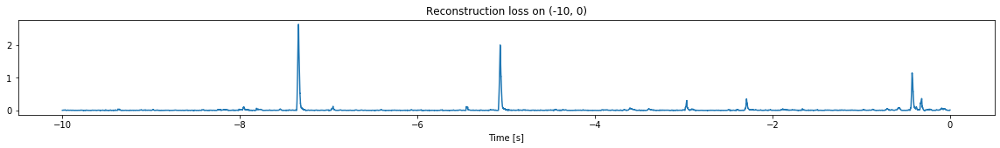

Other trigger time:  [-7.3403997  -5.0676     -2.9650998  -2.2923     -0.42729998]
Their log loss values are:  [2.63396172 2.5146819  1.69699401 1.76411627 2.27115055]


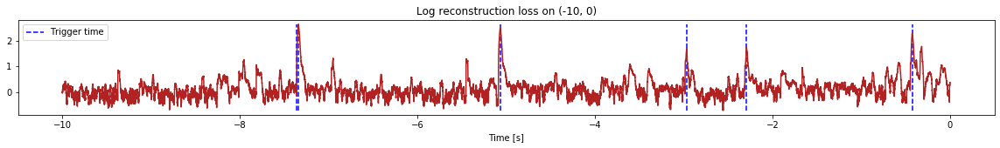

Triggered at:  [-7.3403997, -5.0676, -2.9650998, -2.2923, -0.42729998]
Latent coordinates are:  [[-0.69979537, -0.99281895], [0.0077300416, -0.9844219], [0.07343248, -0.6701987], [-0.26168072, -0.6975187], [-0.24979448, -0.9300257]]
<--------
Finished simulation, all the triggered times are:  [-16.3844, -7.3403997, -5.0676, -2.9650998, -2.2923, -0.42729998]

All latent coordinate:  [[-0.9613982, -0.9999998], [-0.69979537, -0.99281895], [0.0077300416, -0.9844219], [0.07343248, -0.6701987], [-0.26168072, -0.6975187], [-0.24979448, -0.9300257]]


In [20]:
simulation("Ramp_34", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


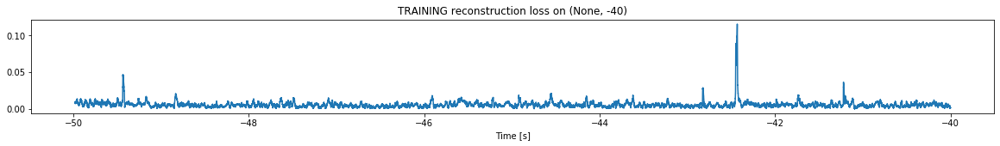

Finished training, median of the log(loss) is:  -2.2799266913041434
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


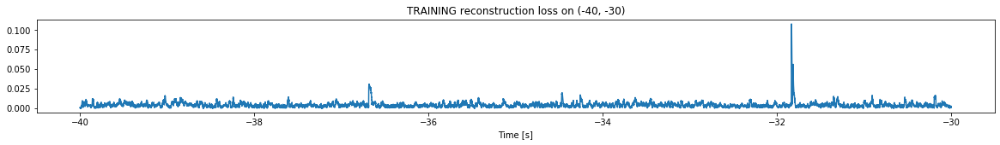

Finished training, median of the log(loss) is:  -2.41974589516413
Triggering for section:  (-30, -20)
Using this median for triggering: -2.2799266913041434
Triggering threshold is:  3.0


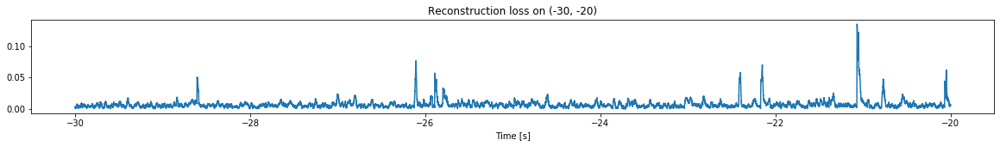

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


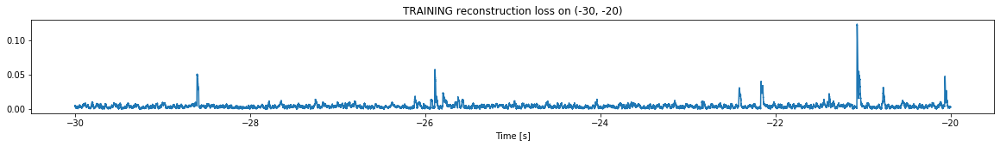

Finished training, median of the log(loss) is:  -2.4276130105461684
Triggering for section:  (-20, -10)
Using this median for triggering: -2.41974589516413
Triggering threshold is:  2.3


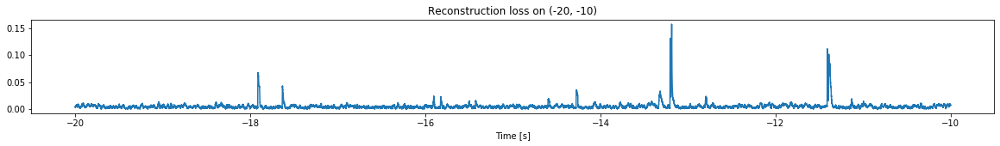

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


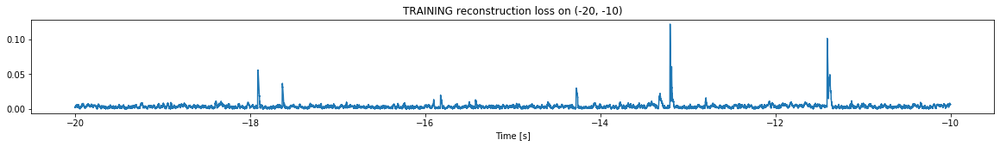

Finished training, median of the log(loss) is:  -2.488671929179734
Triggering for section:  (-10, 0)
Using this median for triggering: -2.4276130105461684
Triggering threshold is:  1.6


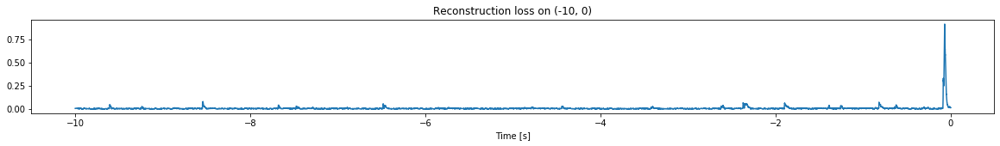

Other trigger time:  [-0.0677]
Their log loss values are:  [2.38929427]


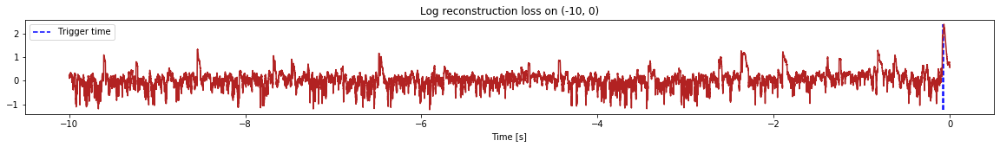

Triggered at:  [-0.0677]
Latent coordinates are:  [[6.6135793, 15.206612]]
<--------
Finished simulation, all the triggered times are:  [-0.0677]

All latent coordinate:  [[6.6135793, 15.206612]]


In [21]:
simulation("Ramp_35", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


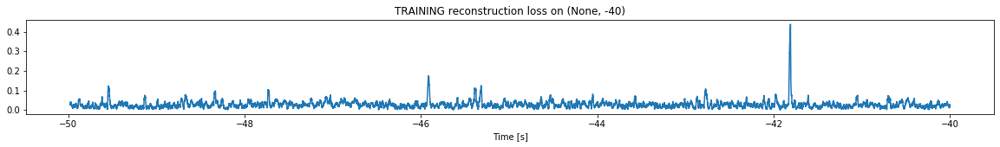

Finished training, median of the log(loss) is:  -1.6032823082980032
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


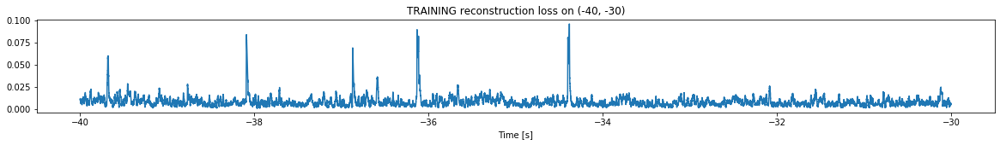

Finished training, median of the log(loss) is:  -2.1307369232839246
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6032823082980032
Triggering threshold is:  3.0


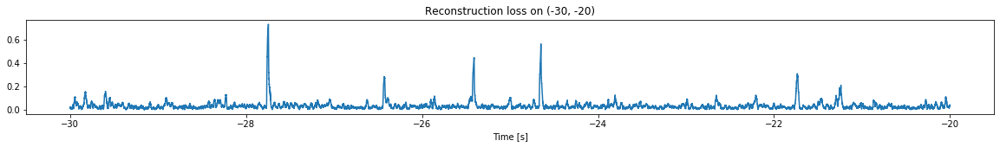

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


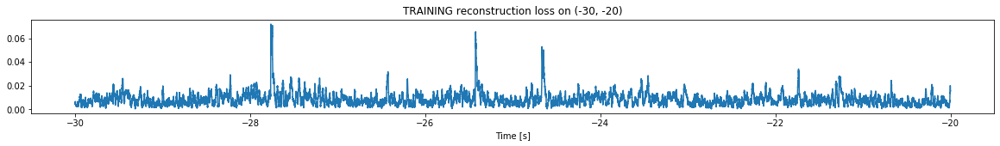

Finished training, median of the log(loss) is:  -2.122291525446222
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1307369232839246
Triggering threshold is:  1.6


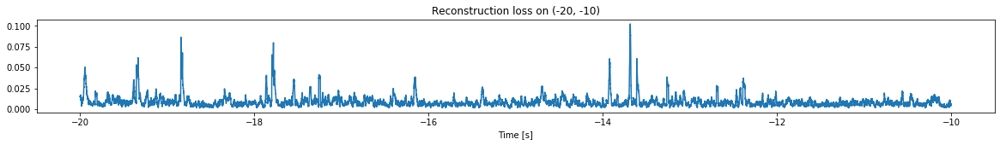

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


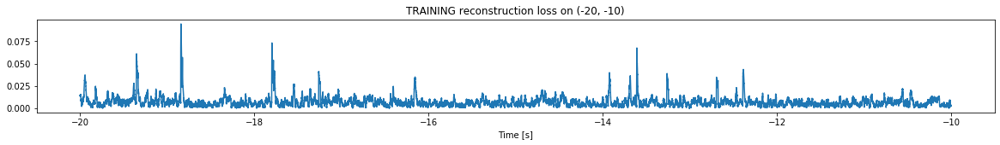

Finished training, median of the log(loss) is:  -2.223536098274033
Triggering for section:  (-10, 0)
Using this median for triggering: -2.122291525446222
Triggering threshold is:  1.6


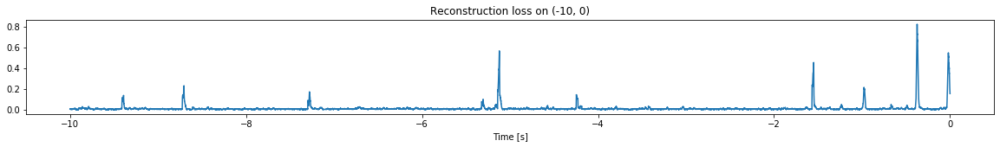

Other trigger time:  [-5.1217    -1.5491999 -0.3737   ]
Their log loss values are:  [1.87563771 1.78021556 2.03779632]


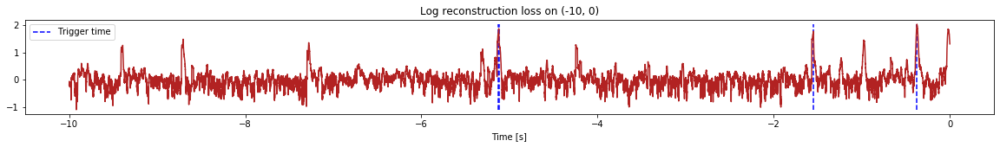

Triggered at:  [-5.1217, -1.5491999, -0.3737]
Latent coordinates are:  [[0.21155578, -0.7341995], [0.026958495, -0.74963224], [-0.37557387, -0.78868574]]
<--------
Finished simulation, all the triggered times are:  [-5.1217, -1.5491999, -0.3737]

All latent coordinate:  [[0.21155578, -0.7341995], [0.026958495, -0.74963224], [-0.37557387, -0.78868574]]


In [22]:
simulation("Ramp_36", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


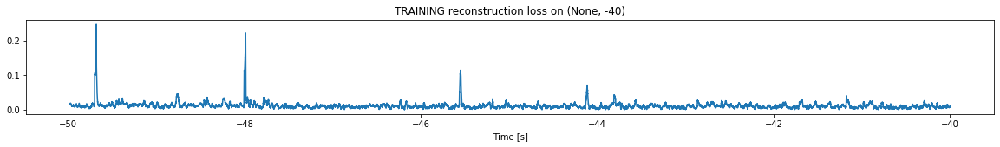

Finished training, median of the log(loss) is:  -1.99338549326254
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


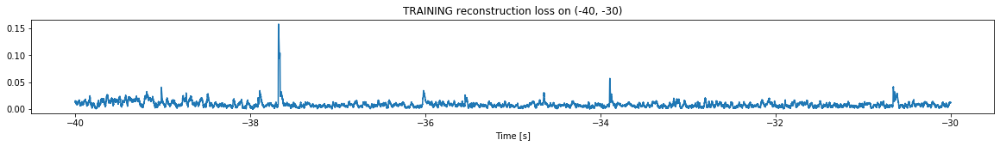

Finished training, median of the log(loss) is:  -2.120916070606397
Triggering for section:  (-30, -20)
Using this median for triggering: -1.99338549326254
Triggering threshold is:  3.0


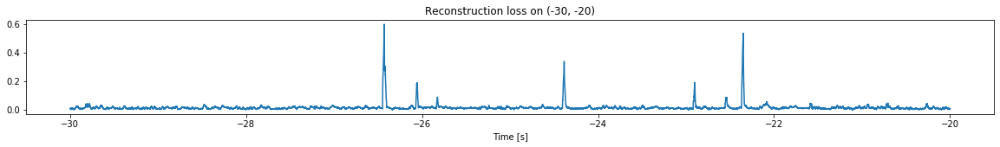

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


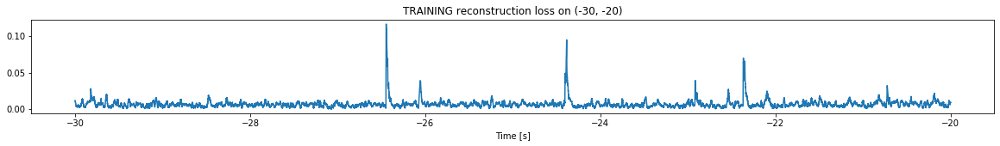

Finished training, median of the log(loss) is:  -2.213829483629523
Triggering for section:  (-20, -10)
Using this median for triggering: -2.120916070606397
Triggering threshold is:  1.6


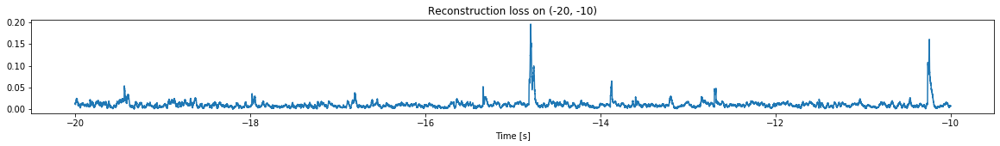

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


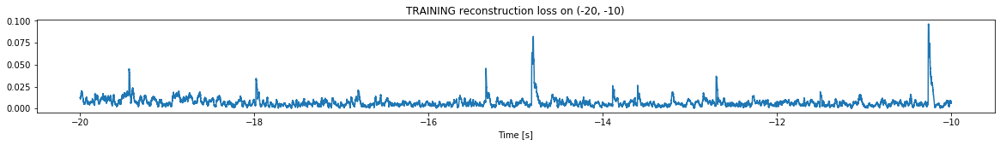

Finished training, median of the log(loss) is:  -2.247528295386382
Triggering for section:  (-10, 0)
Using this median for triggering: -2.213829483629523
Triggering threshold is:  1.6


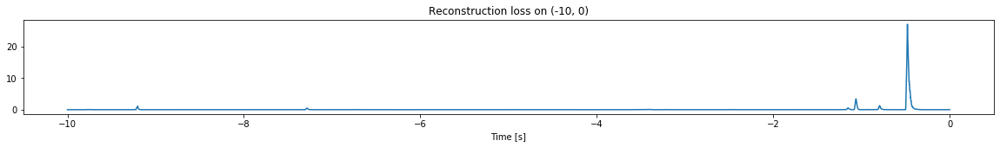

Other trigger time:  [-9.2028     -7.284      -1.0619999  -0.47869998]
Their log loss values are:  [2.26386672 1.95120109 2.74903145 3.64758841]


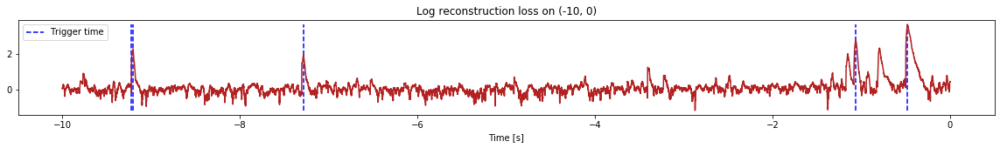

Triggered at:  [-9.2028, -7.284, -1.0619999, -0.47869998]
Latent coordinates are:  [[-0.7552771, -0.61354864], [-0.6057116, -0.52202165], [-0.96191764, -0.67009836], [-0.99999994, 1.4527508]]
<--------
Finished simulation, all the triggered times are:  [-9.2028, -7.284, -1.0619999, -0.47869998]

All latent coordinate:  [[-0.7552771, -0.61354864], [-0.6057116, -0.52202165], [-0.96191764, -0.67009836], [-0.99999994, 1.4527508]]


In [23]:
simulation("Ramp_37", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


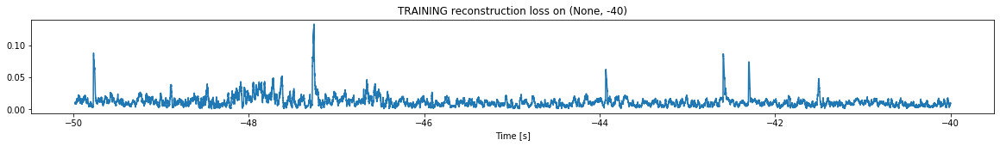

Finished training, median of the log(loss) is:  -1.9842123330263248
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


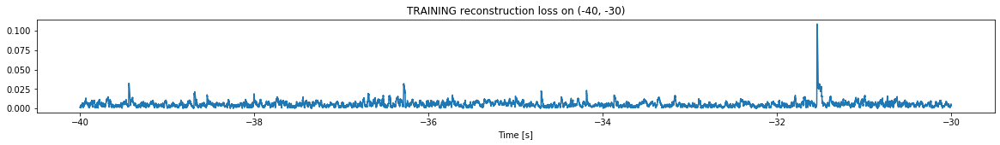

Finished training, median of the log(loss) is:  -2.3153858127258076
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9842123330263248
Triggering threshold is:  3.0


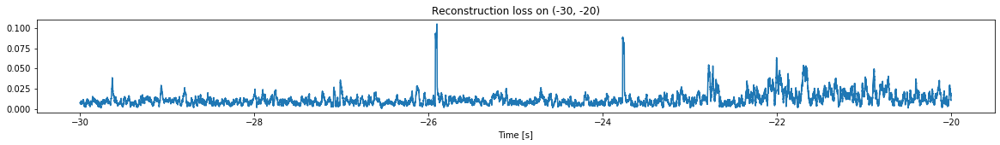

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


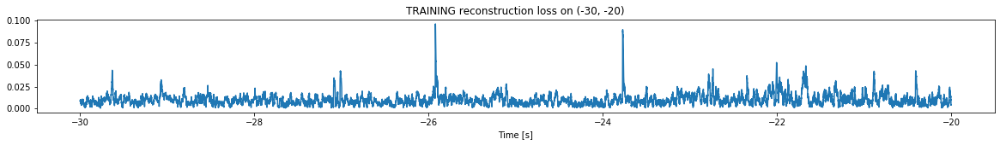

Finished training, median of the log(loss) is:  -2.053245215322632
Triggering for section:  (-20, -10)
Using this median for triggering: -2.3153858127258076
Triggering threshold is:  1.6


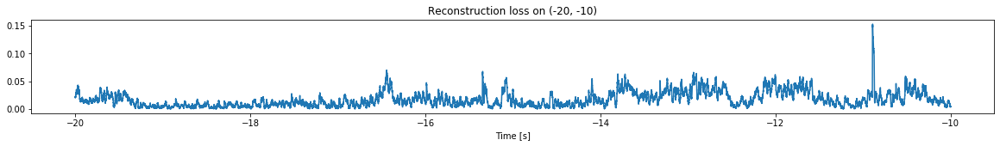

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


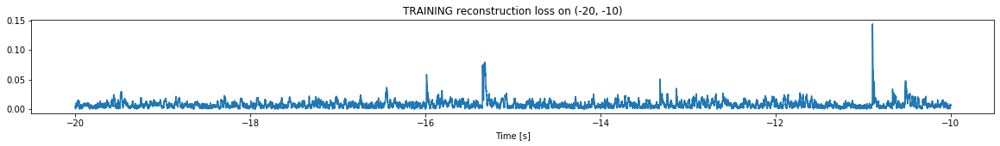

Finished training, median of the log(loss) is:  -2.1752545985761405
Triggering for section:  (-10, 0)
Using this median for triggering: -2.053245215322632
Triggering threshold is:  1.6


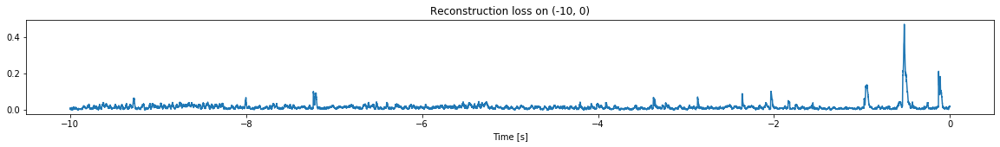

Other trigger time:  [-0.5198]
Their log loss values are:  [1.72549315]


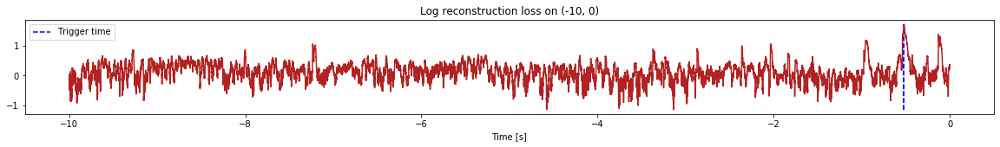

Triggered at:  [-0.5198]
Latent coordinates are:  [[1.6040707, 8.121092]]
<--------
Finished simulation, all the triggered times are:  [-0.5198]

All latent coordinate:  [[1.6040707, 8.121092]]


In [24]:
simulation("Ramp_38", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


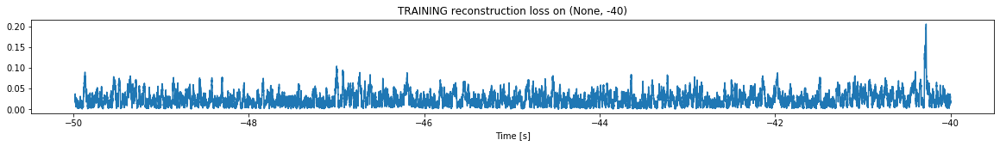

Finished training, median of the log(loss) is:  -1.6684812283174364
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


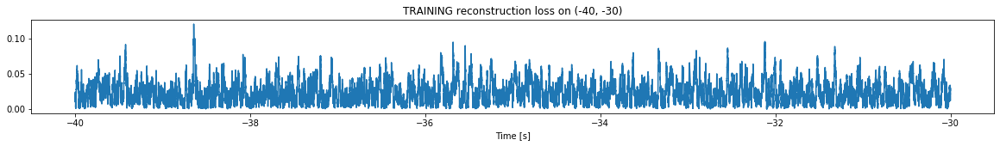

Finished training, median of the log(loss) is:  -1.6776357995416062
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6684812283174364
Triggering threshold is:  3.0


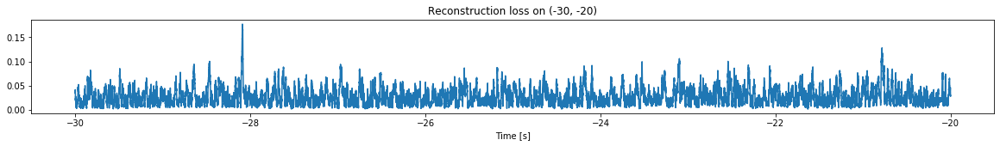

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


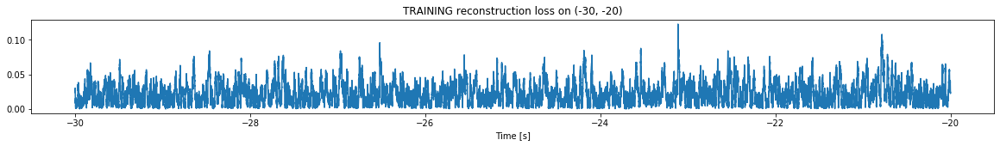

Finished training, median of the log(loss) is:  -1.7002047943195886
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6776357995416062
Triggering threshold is:  1.6


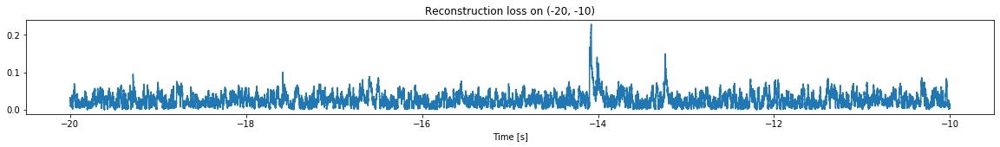

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


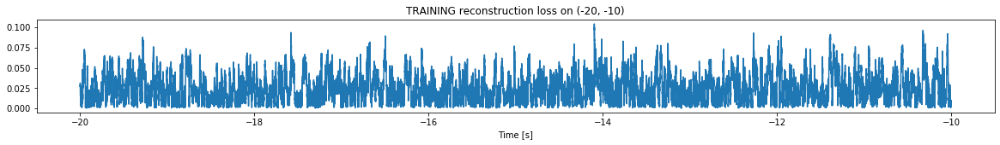

Finished training, median of the log(loss) is:  -1.6725869831403006
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7002047943195886
Triggering threshold is:  1.6


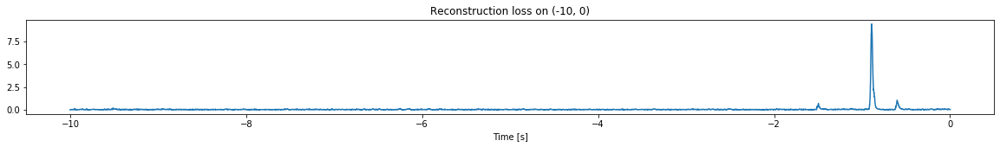

Other trigger time:  [-0.89089996]
Their log loss values are:  [2.67423946]


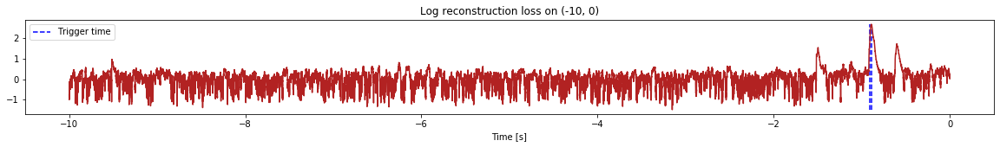

Triggered at:  [-0.89089996]
Latent coordinates are:  [[-1.0, 21.230902]]
<--------
Finished simulation, all the triggered times are:  [-0.89089996]

All latent coordinate:  [[-1.0, 21.230902]]


In [25]:
simulation("Ramp_39", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

-------

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


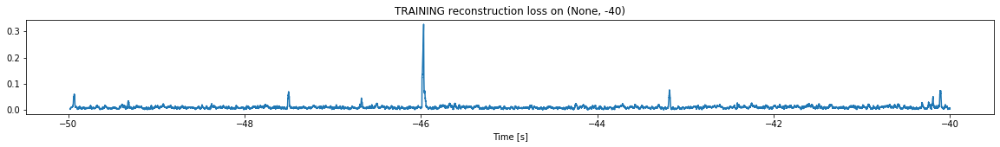

Finished training, median of the log(loss) is:  -2.029683873685218
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


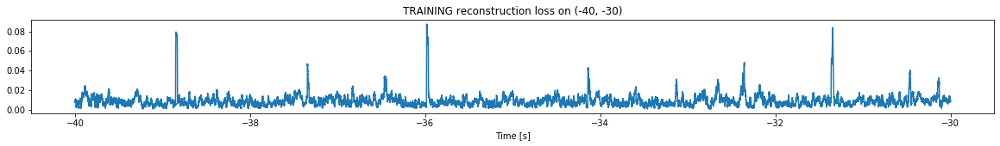

Finished training, median of the log(loss) is:  -2.1079102068562943
Triggering for section:  (-30, -20)
Using this median for triggering: -2.029683873685218
Triggering threshold is:  3.0


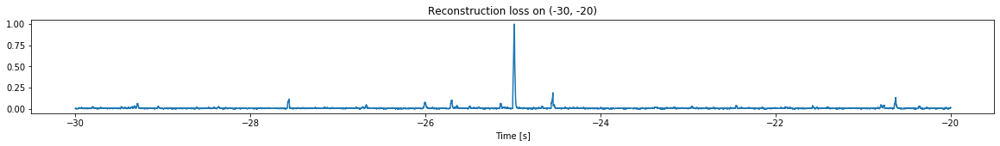

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


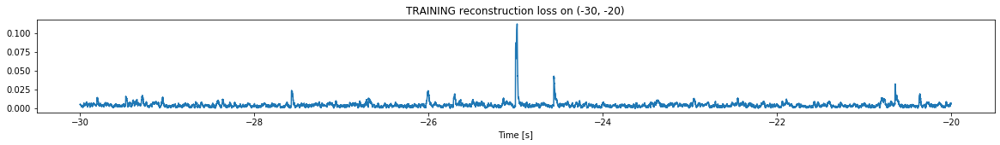

Finished training, median of the log(loss) is:  -2.381264514110196
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1079102068562943
Triggering threshold is:  1.6


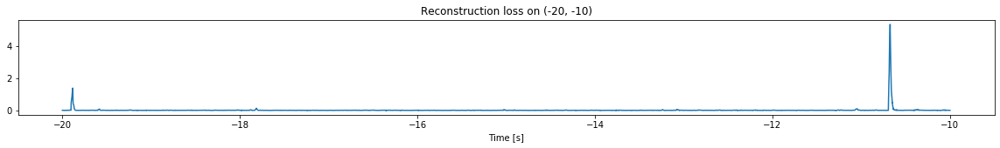

Other trigger time:  [-19.8829 -10.6746]
Their log loss values are:  [2.25335203 2.83829267]


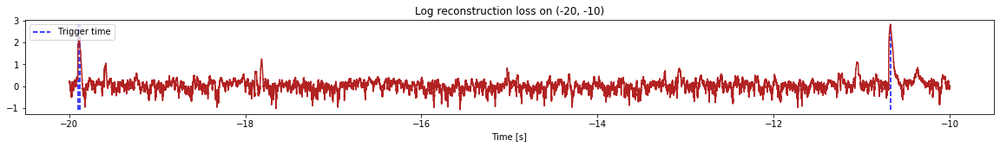

Triggered at:  [-19.8829, -10.6746]
Latent coordinates are:  [[-0.49691916, -0.9337684], [-0.9187173, -0.9984121]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


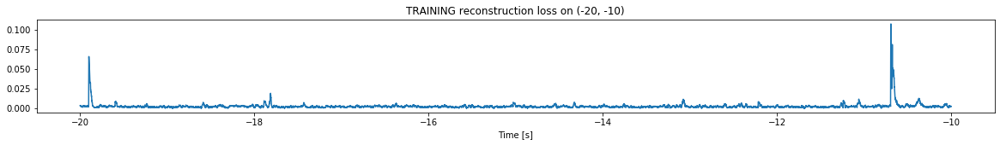

Finished training, median of the log(loss) is:  -2.6734356650286584
Triggering for section:  (-10, 0)
Using this median for triggering: -2.381264514110196
Triggering threshold is:  1.6


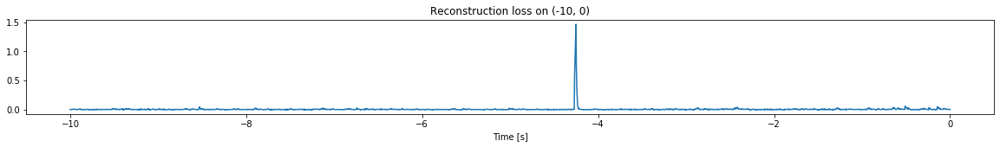

Other trigger time:  [-4.2517]
Their log loss values are:  [2.54741415]


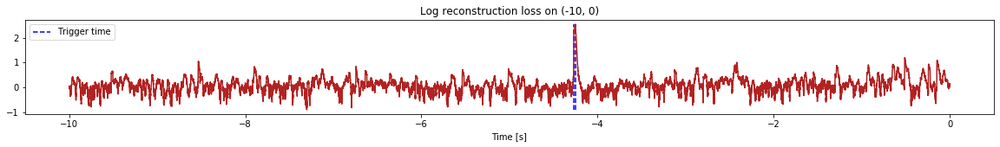

Triggered at:  [-4.2517]
Latent coordinates are:  [[-0.9487176, -0.4694134]]
<--------
Finished simulation, all the triggered times are:  [-19.8829, -10.6746, -4.2517]

All latent coordinate:  [[-0.49691916, -0.9337684], [-0.9187173, -0.9984121], [-0.9487176, -0.4694134]]


In [28]:
simulation("Ramp_41", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


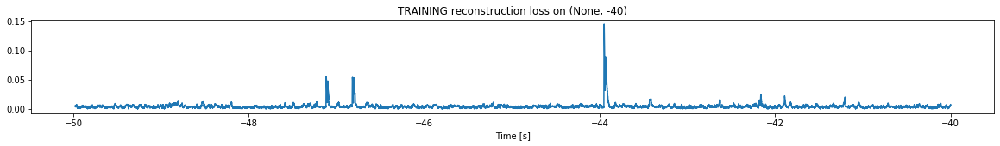

Finished training, median of the log(loss) is:  -2.4032068297034606
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


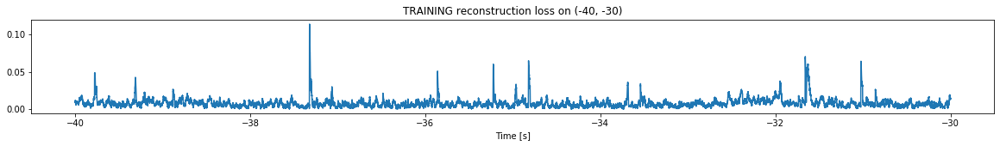

Finished training, median of the log(loss) is:  -2.160730150461806
Triggering for section:  (-30, -20)
Using this median for triggering: -2.4032068297034606
Triggering threshold is:  3.0


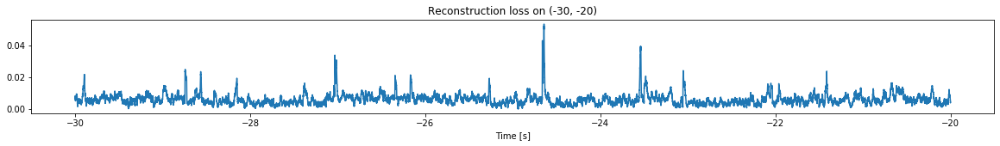

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


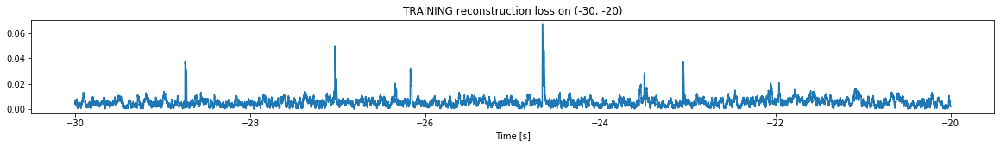

Finished training, median of the log(loss) is:  -2.295033205825187
Triggering for section:  (-20, -10)
Using this median for triggering: -2.160730150461806
Triggering threshold is:  1.6


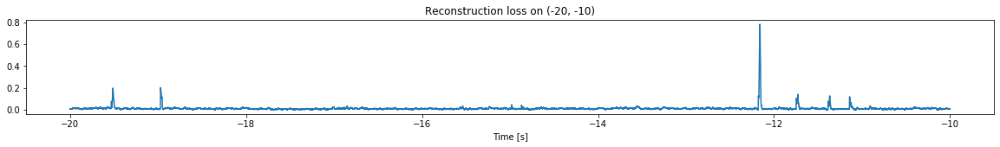

Other trigger time:  [-12.159699]
Their log loss values are:  [2.05476317]


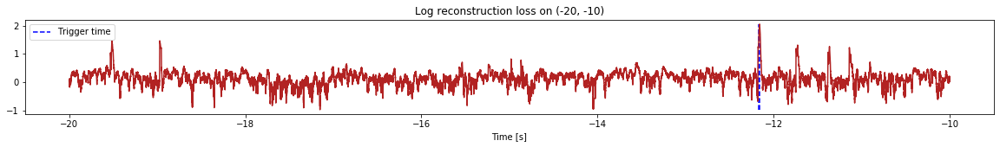

Triggered at:  [-12.159699]
Latent coordinates are:  [[2.7064438, 0.4781257]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


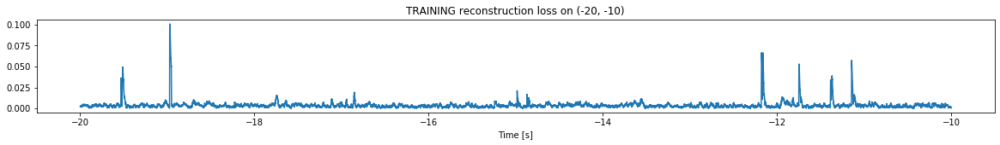

Finished training, median of the log(loss) is:  -2.5089828413297672
Triggering for section:  (-10, 0)
Using this median for triggering: -2.295033205825187
Triggering threshold is:  1.6


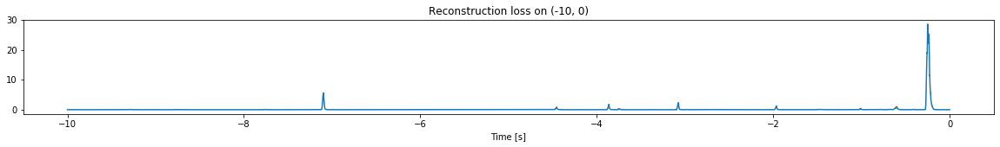

Other trigger time:  [-7.0990996 -4.4539    -3.8628    -3.0742    -1.9646    -1.0057
 -0.249    ]
Their log loss values are:  [3.04579384 2.24762706 2.54921649 2.66942284 2.38760253 1.95084211
 3.75108714]


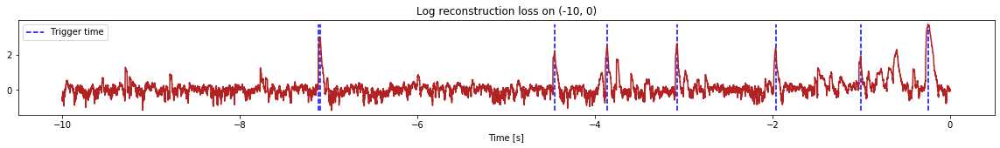

Triggered at:  [-7.0990996, -4.4539, -3.8628, -3.0742, -1.9646, -1.0057, -0.249]
Latent coordinates are:  [[3.2109866, 0.5285811], [2.8550346, 0.49243265], [3.0832436, 0.4887966], [3.1404493, 0.49606794], [2.9741433, 0.5505449], [2.4868042, 0.30713308], [1.8288765, -0.40323418]]
<--------
Finished simulation, all the triggered times are:  [-12.159699, -7.0990996, -4.4539, -3.8628, -3.0742, -1.9646, -1.0057, -0.249]

All latent coordinate:  [[2.7064438, 0.4781257], [3.2109866, 0.5285811], [2.8550346, 0.49243265], [3.0832436, 0.4887966], [3.1404493, 0.49606794], [2.9741433, 0.5505449], [2.4868042, 0.30713308], [1.8288765, -0.40323418]]


In [29]:
simulation("Ramp_44", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


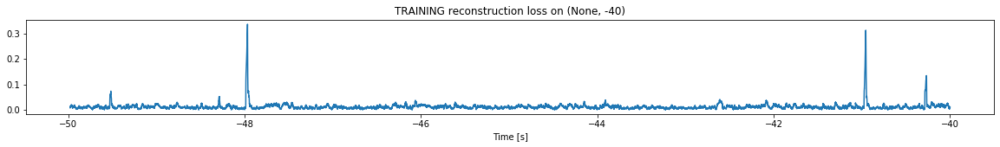

Finished training, median of the log(loss) is:  -1.9859700110907776
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


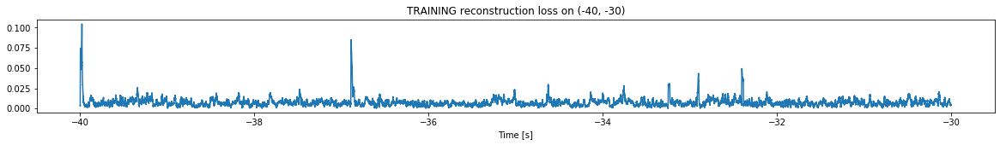

Finished training, median of the log(loss) is:  -2.1735858817299536
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9859700110907776
Triggering threshold is:  3.0


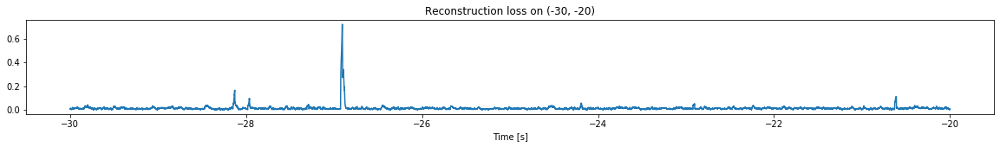

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


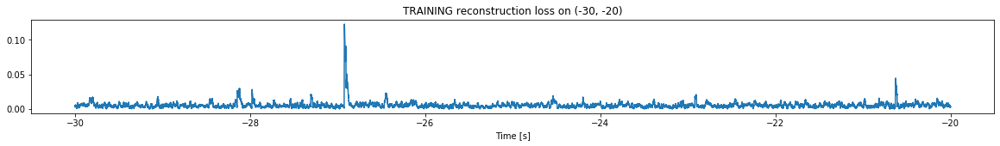

Finished training, median of the log(loss) is:  -2.3142051490684956
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1735858817299536
Triggering threshold is:  1.6


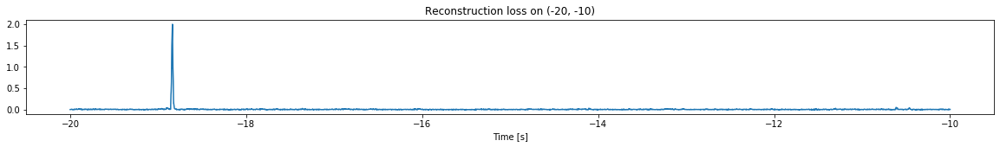

Other trigger time:  [-18.838]
Their log loss values are:  [2.47481508]


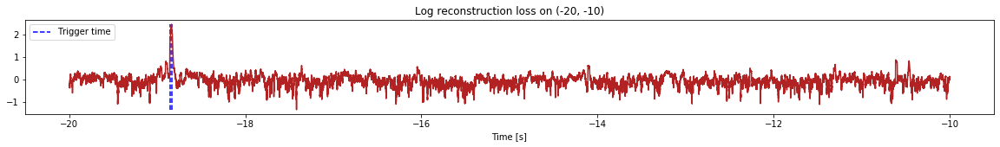

Triggered at:  [-18.838]
Latent coordinates are:  [[-0.3253652, -0.9468755]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


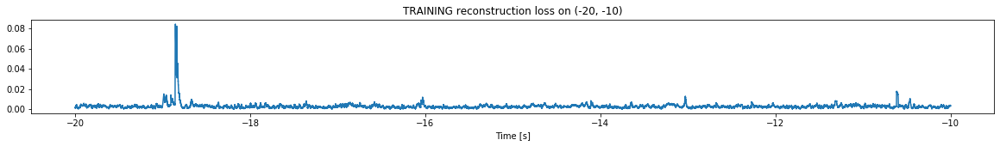

Finished training, median of the log(loss) is:  -2.6026532535785107
Triggering for section:  (-10, 0)
Using this median for triggering: -2.3142051490684956
Triggering threshold is:  1.6


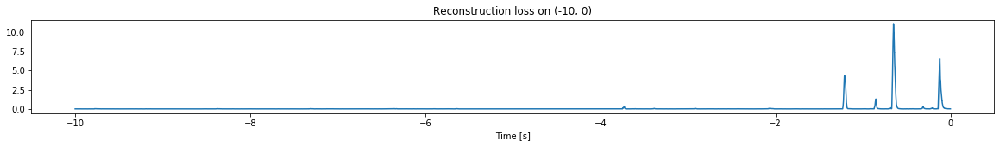

Other trigger time:  [-3.7264998 -1.2109    -0.6502    -0.1209   ]
Their log loss values are:  [1.86694237 2.95797455 3.35959593 3.13090599]


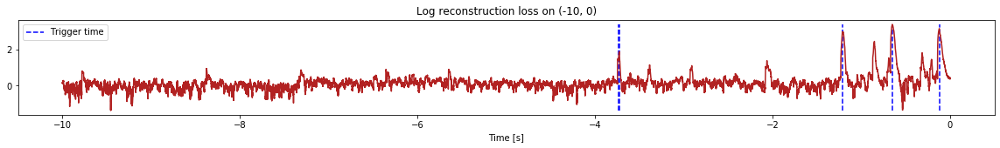

Triggered at:  [-3.7264998, -1.2109, -0.6502, -0.1209]
Latent coordinates are:  [[-0.12601846, -0.668632], [-0.9274848, -0.9858442], [-0.99957013, -0.99956], [-0.97565156, -0.9972669]]
<--------
Finished simulation, all the triggered times are:  [-18.838, -3.7264998, -1.2109, -0.6502, -0.1209]

All latent coordinate:  [[-0.3253652, -0.9468755], [-0.12601846, -0.668632], [-0.9274848, -0.9858442], [-0.99957013, -0.99956], [-0.97565156, -0.9972669]]


In [30]:
simulation("Ramp_45", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


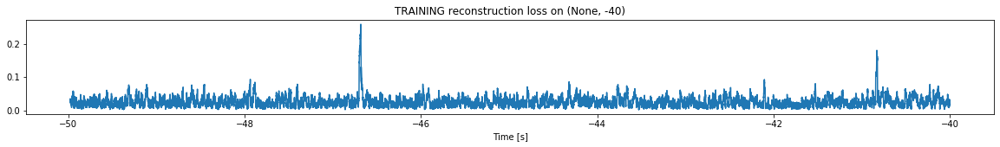

Finished training, median of the log(loss) is:  -1.6602353932458143
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


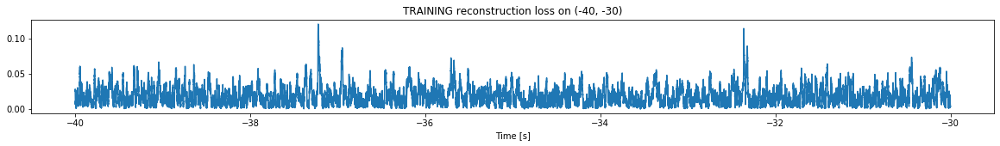

Finished training, median of the log(loss) is:  -1.792497780453067
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6602353932458143
Triggering threshold is:  3.0


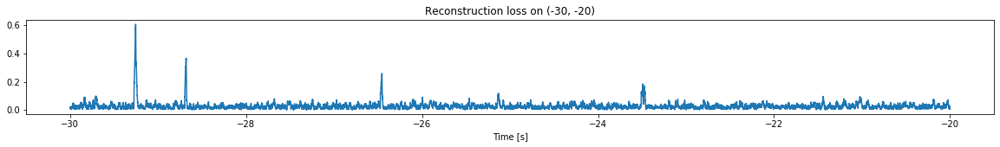

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


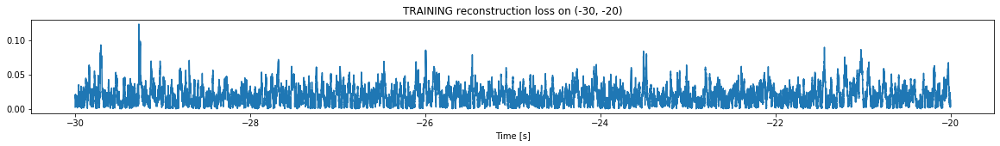

Finished training, median of the log(loss) is:  -1.7671992019870686
Triggering for section:  (-20, -10)
Using this median for triggering: -1.792497780453067
Triggering threshold is:  2.3


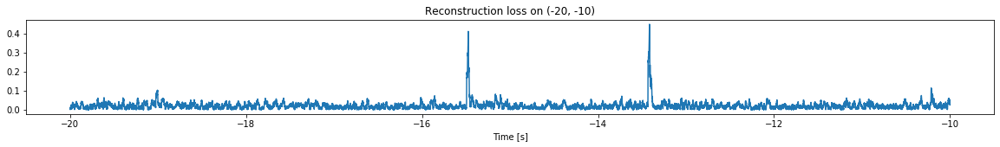

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


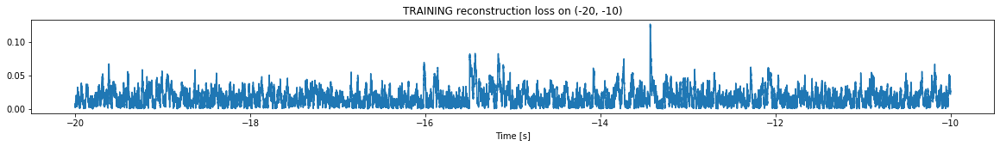

Finished training, median of the log(loss) is:  -1.8343206030043135
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7671992019870686
Triggering threshold is:  1.6


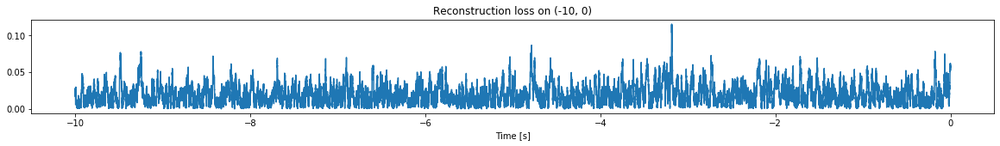

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [31]:
simulation("Ramp_46", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


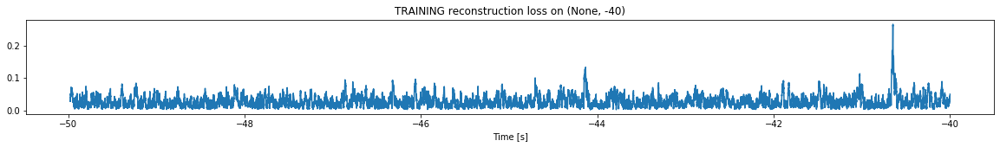

Finished training, median of the log(loss) is:  -1.6456433430374853
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


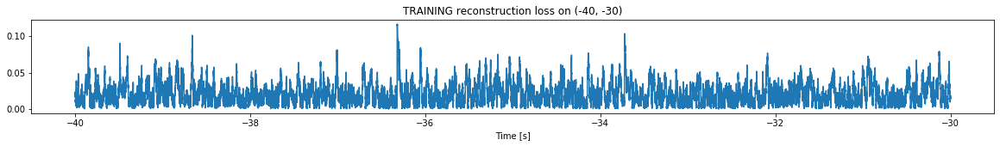

Finished training, median of the log(loss) is:  -1.7549684408257995
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6456433430374853
Triggering threshold is:  3.0


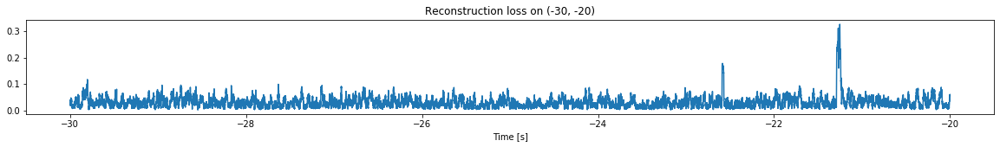

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


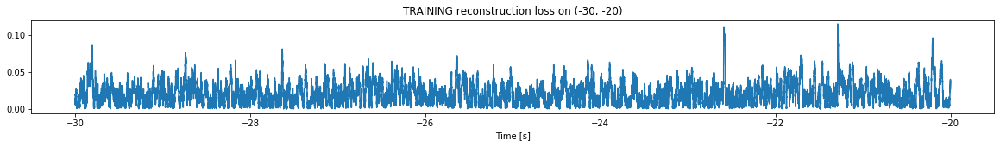

Finished training, median of the log(loss) is:  -1.743715316839634
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7549684408257995
Triggering threshold is:  1.6


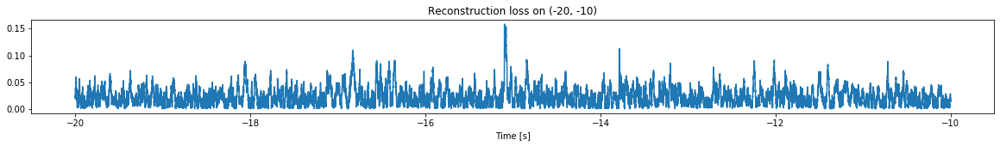

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


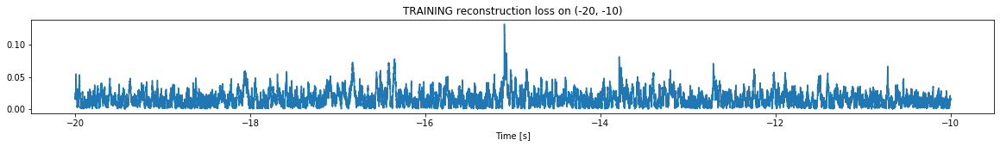

Finished training, median of the log(loss) is:  -1.8518865458918699
Triggering for section:  (-10, 0)
Using this median for triggering: -1.743715316839634
Triggering threshold is:  1.6


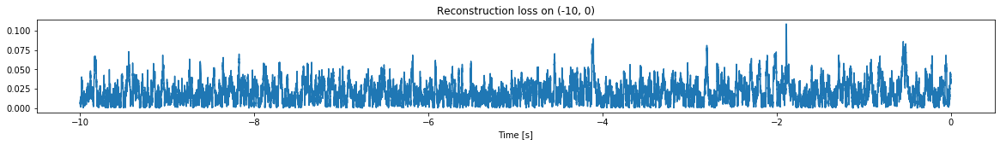

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [32]:
simulation("Ramp_47", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


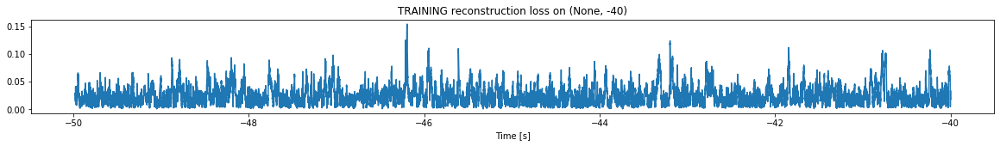

Finished training, median of the log(loss) is:  -1.693966261333284
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


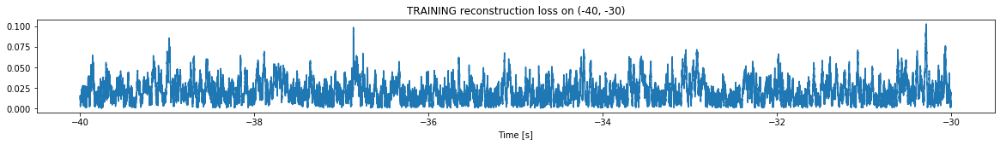

Finished training, median of the log(loss) is:  -1.7395552238861458
Triggering for section:  (-30, -20)
Using this median for triggering: -1.693966261333284
Triggering threshold is:  3.0


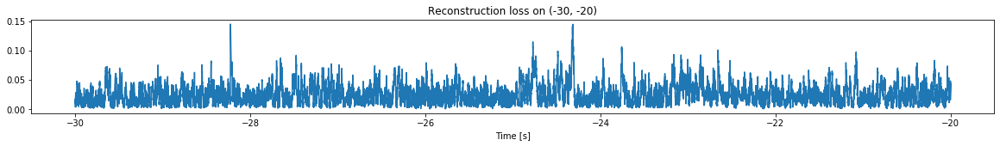

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


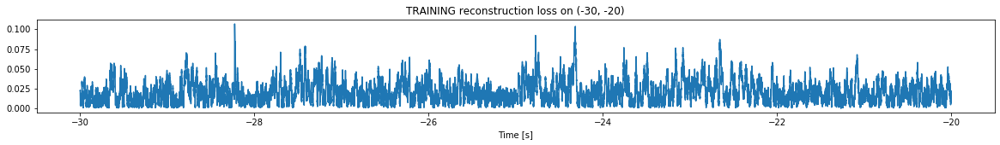

Finished training, median of the log(loss) is:  -1.749684487428203
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7395552238861458
Triggering threshold is:  2.3


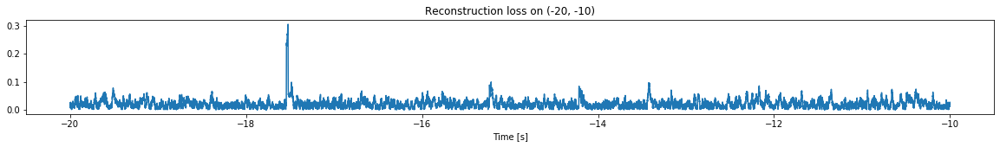

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


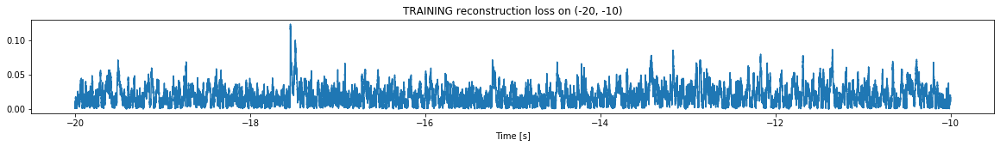

Finished training, median of the log(loss) is:  -1.7711411648085682
Triggering for section:  (-10, 0)
Using this median for triggering: -1.749684487428203
Triggering threshold is:  1.6


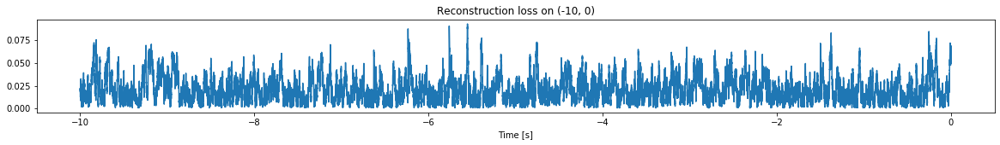

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [33]:
simulation("Ramp_48", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


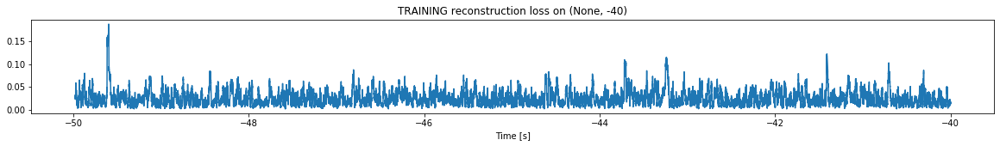

Finished training, median of the log(loss) is:  -1.6740890363300576
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


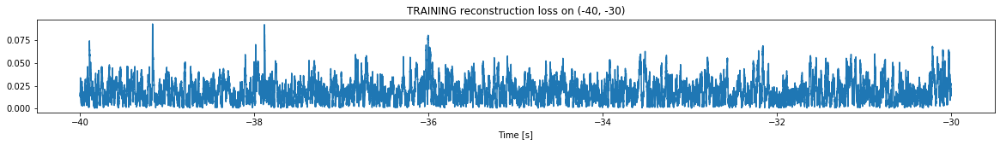

Finished training, median of the log(loss) is:  -1.7738258151754362
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6740890363300576
Triggering threshold is:  3.0


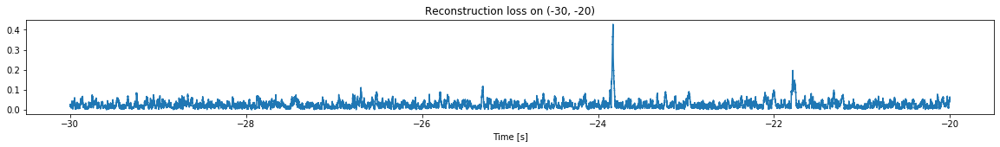

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


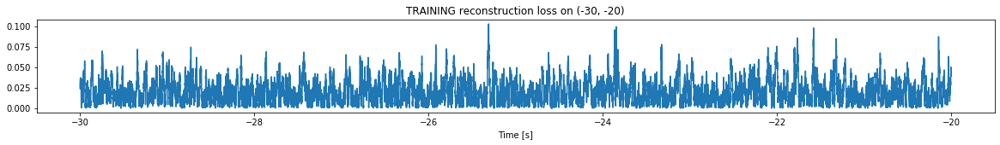

Finished training, median of the log(loss) is:  -1.7445057302962763
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7738258151754362
Triggering threshold is:  1.6


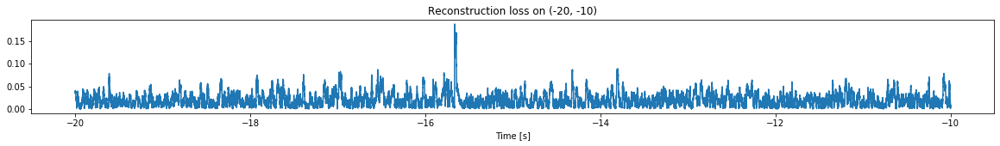

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


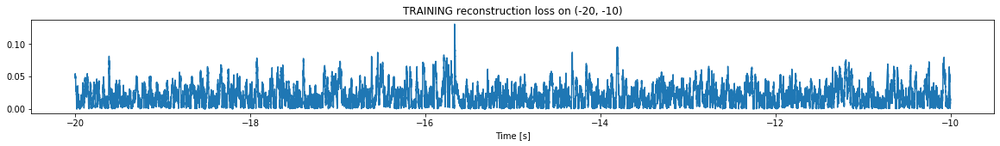

Finished training, median of the log(loss) is:  -1.7531157771414945
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7445057302962763
Triggering threshold is:  1.6


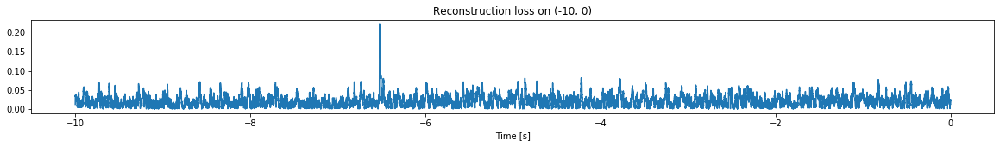

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [34]:
simulation("Ramp_49", "15T_data", 10,  time_range = (-50,0), reached_max = -1)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


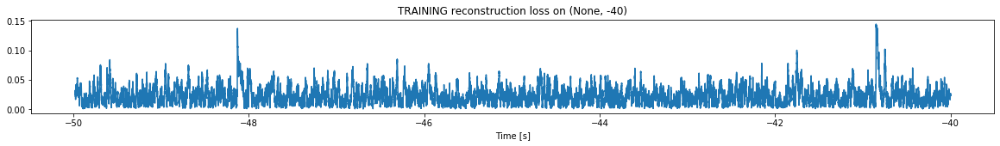

Finished training, median of the log(loss) is:  -1.706746482394826
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


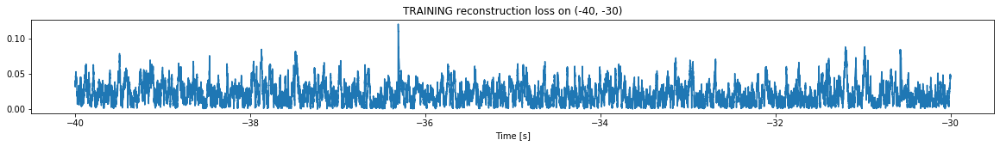

Finished training, median of the log(loss) is:  -1.7230903985786903
Triggering for section:  (-30, -20)
Using this median for triggering: -1.706746482394826
Triggering threshold is:  3.0


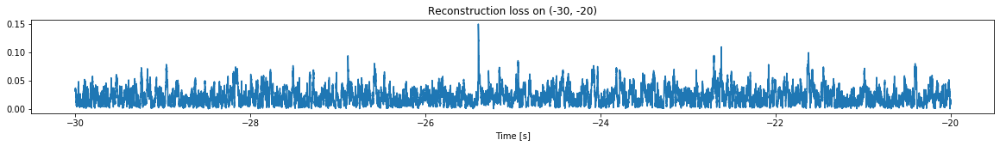

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


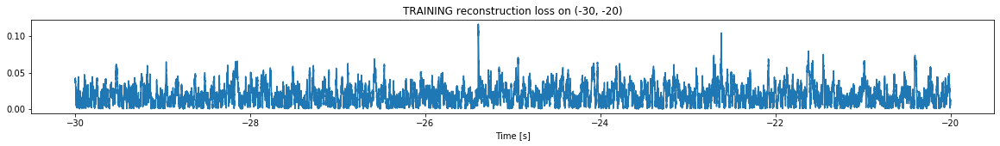

Finished training, median of the log(loss) is:  -1.7836288184678872
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7230903985786903
Triggering threshold is:  2.3


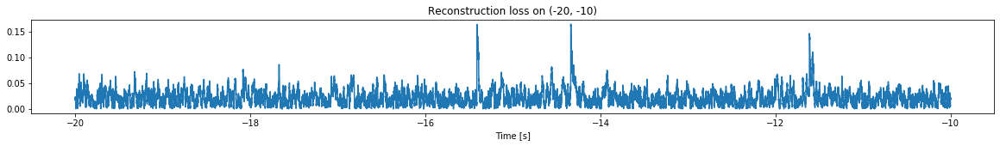

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


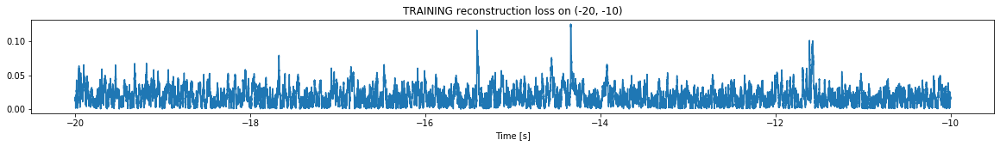

Finished training, median of the log(loss) is:  -1.7866539258725176
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7836288184678872
Triggering threshold is:  1.6


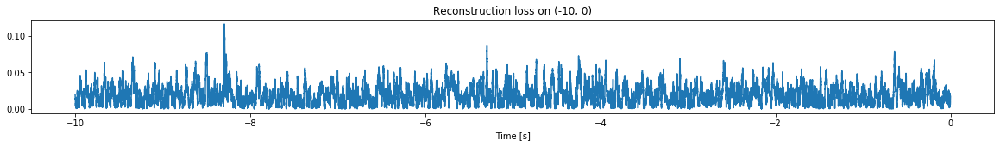

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [35]:
simulation("Ramp_50", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

--------

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


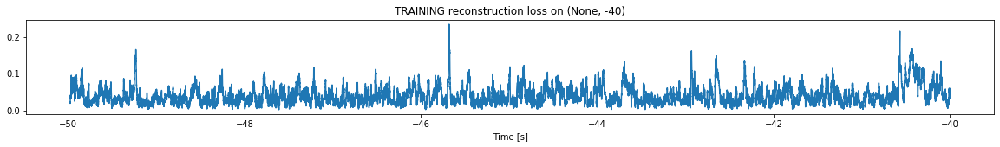

Finished training, median of the log(loss) is:  -1.4655763449362853
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


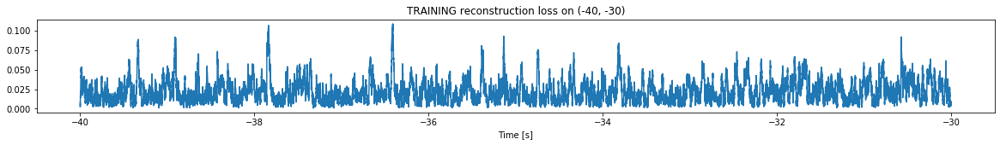

Finished training, median of the log(loss) is:  -1.7162403218355156
Triggering for section:  (-30, -20)
Using this median for triggering: -1.4655763449362853
Triggering threshold is:  3.0


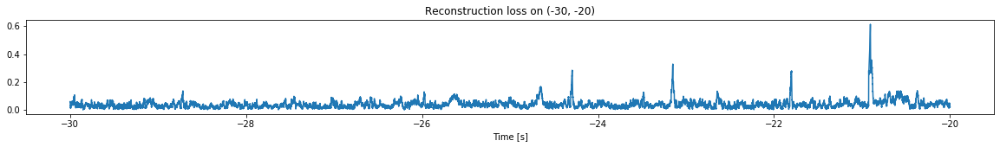

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


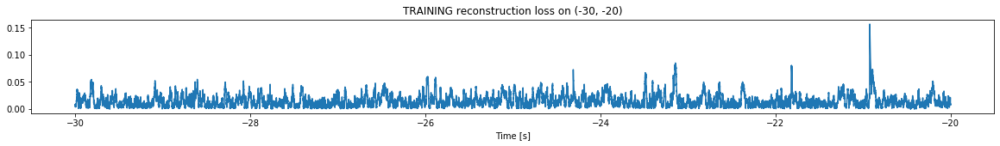

Finished training, median of the log(loss) is:  -1.9151212160294016
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7162403218355156
Triggering threshold is:  1.6


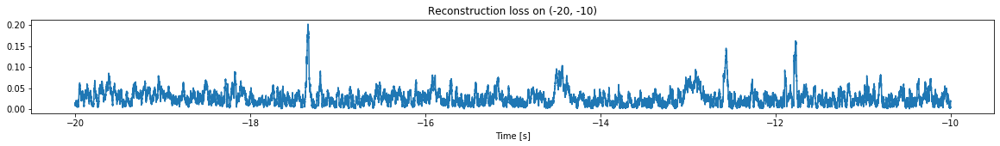

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


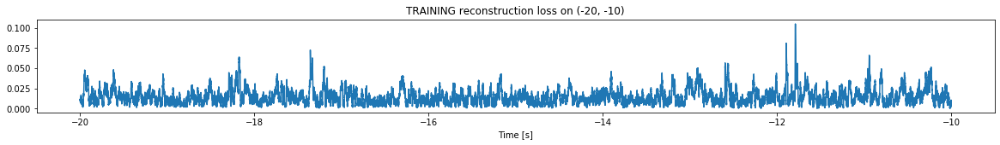

Finished training, median of the log(loss) is:  -1.894559995120919
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9151212160294016
Triggering threshold is:  1.6


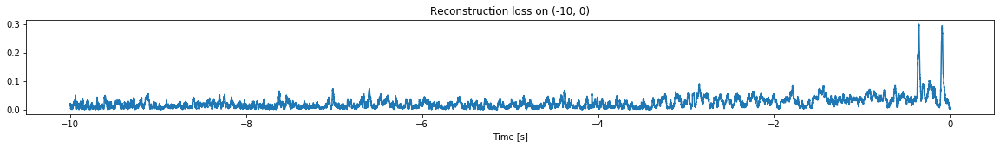

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [37]:
simulation("Ramp_53", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


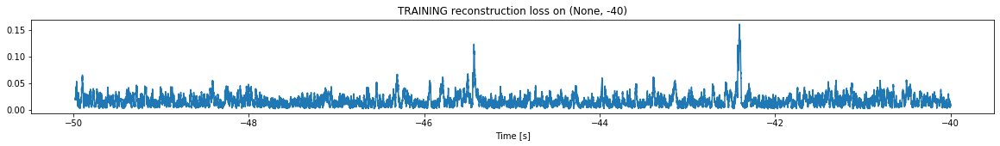

Finished training, median of the log(loss) is:  -1.8682651907142755
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


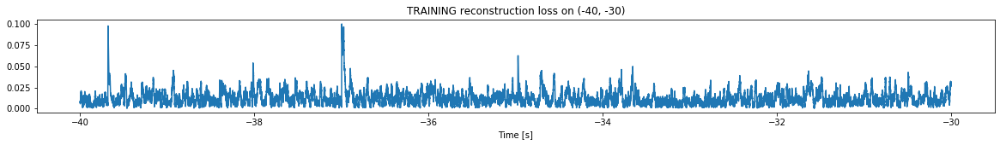

Finished training, median of the log(loss) is:  -1.9744003461026596
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8682651907142755
Triggering threshold is:  3.0


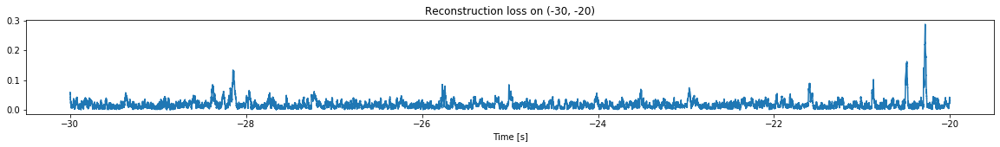

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


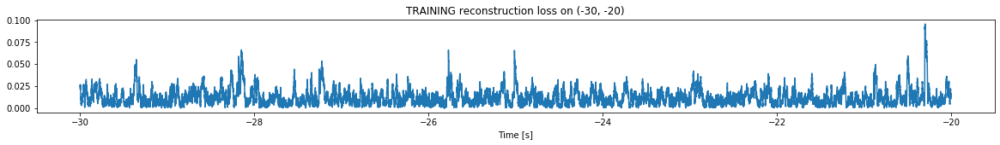

Finished training, median of the log(loss) is:  -1.9818888576554912
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9744003461026596
Triggering threshold is:  2.3


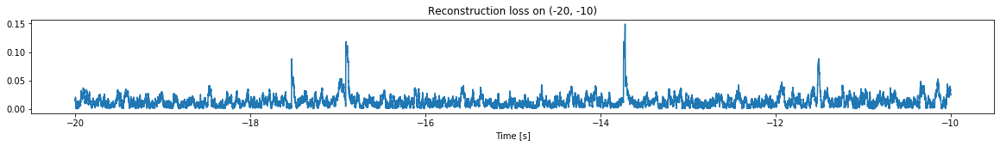

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


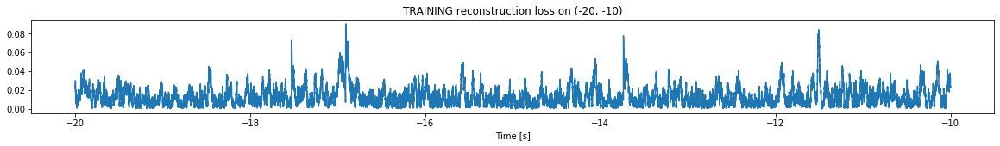

Finished training, median of the log(loss) is:  -1.957855646356256
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9818888576554912
Triggering threshold is:  1.6


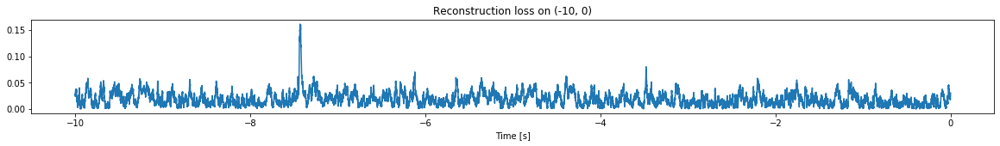

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [38]:
simulation("Ramp_54", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


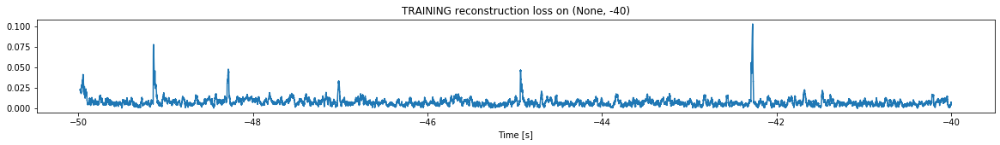

Finished training, median of the log(loss) is:  -2.1850000396938554
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


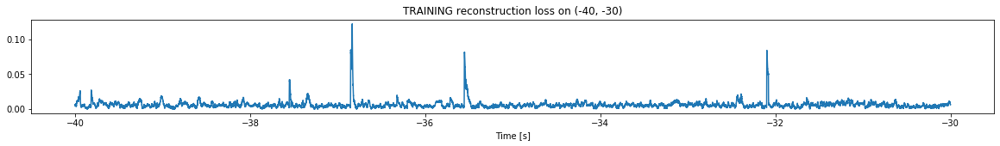

Finished training, median of the log(loss) is:  -2.260947922622841
Triggering for section:  (-30, -20)
Using this median for triggering: -2.1850000396938554
Triggering threshold is:  3.0


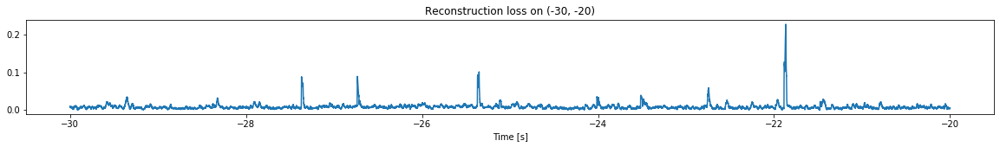

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


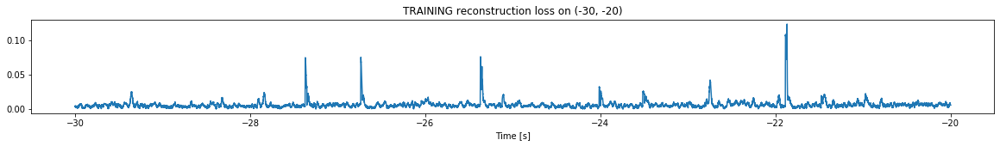

Finished training, median of the log(loss) is:  -2.277704452751392
Triggering for section:  (-20, -10)
Using this median for triggering: -2.260947922622841
Triggering threshold is:  2.3


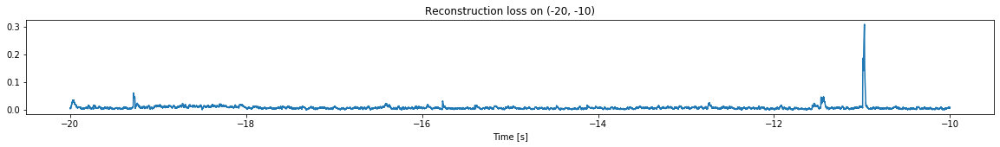

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


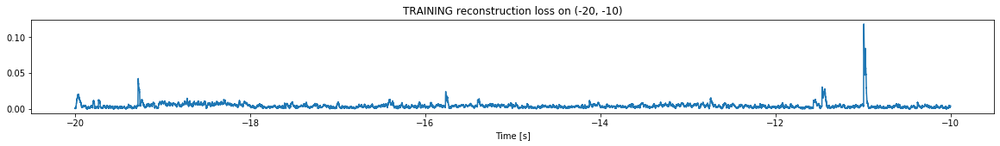

Finished training, median of the log(loss) is:  -2.4065723714058103
Triggering for section:  (-10, 0)
Using this median for triggering: -2.277704452751392
Triggering threshold is:  1.6


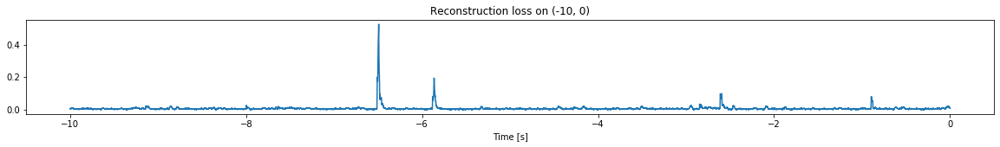

Other trigger time:  [-6.4923997]
Their log loss values are:  [1.99835695]


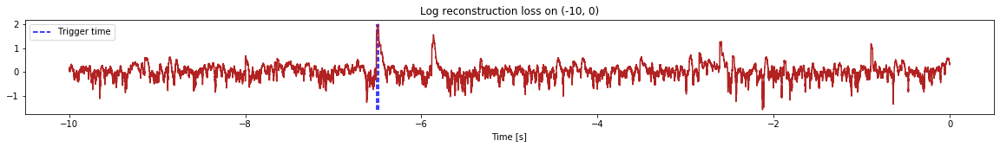

Triggered at:  [-6.4923997]
Latent coordinates are:  [[3.9543948, -0.5733413]]
<--------
Finished simulation, all the triggered times are:  [-6.4923997]

All latent coordinate:  [[3.9543948, -0.5733413]]


In [39]:
simulation("Ramp_55", "15T_data", 10,  time_range = (-50,0), reached_max = 0)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


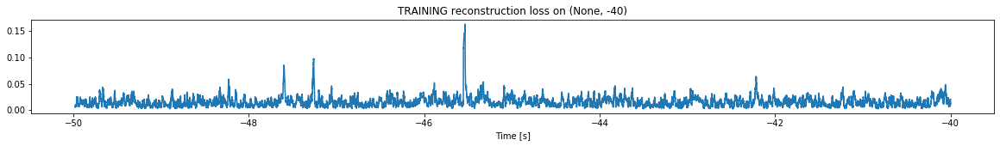

Finished training, median of the log(loss) is:  -1.8605658082867202
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


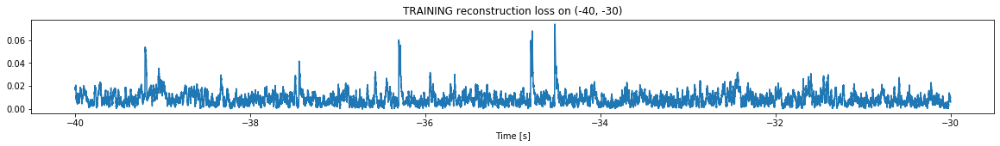

Finished training, median of the log(loss) is:  -2.087298323922579
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8605658082867202
Triggering threshold is:  3.0


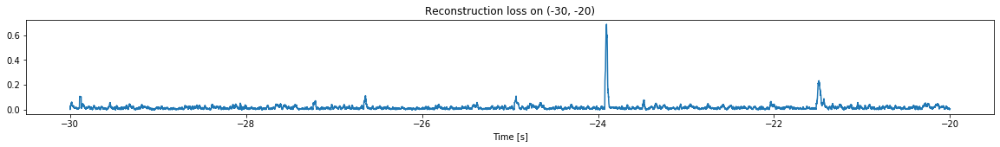

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


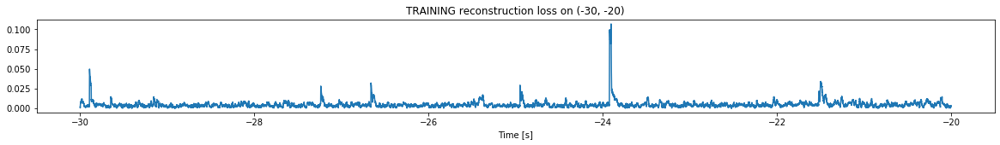

Finished training, median of the log(loss) is:  -2.389004633481126
Triggering for section:  (-20, -10)
Using this median for triggering: -2.087298323922579
Triggering threshold is:  1.6


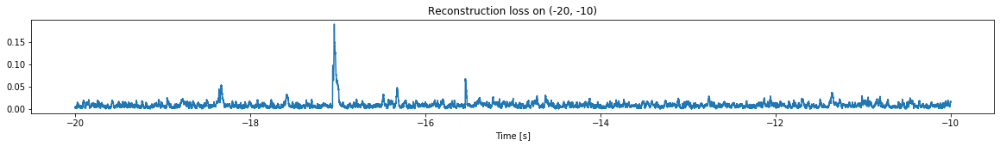

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


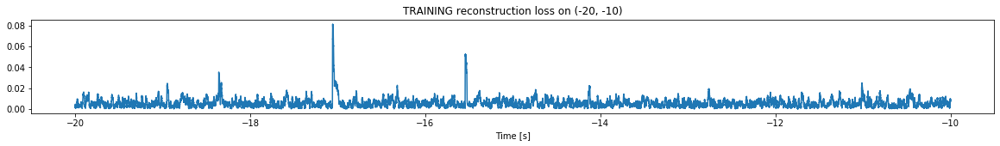

Finished training, median of the log(loss) is:  -2.299621333493363
Triggering for section:  (-10, 0)
Using this median for triggering: -2.389004633481126
Triggering threshold is:  1.6


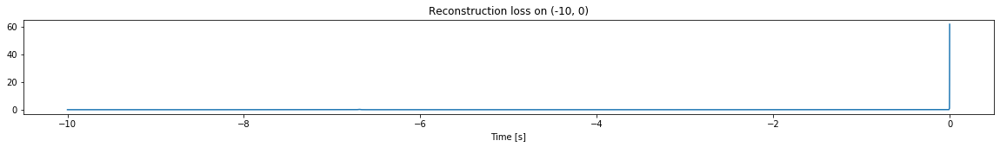

Other trigger time:  [-6.6898e+00 -4.9000e-03]
Their log loss values are:  [1.8560214  2.10965983]


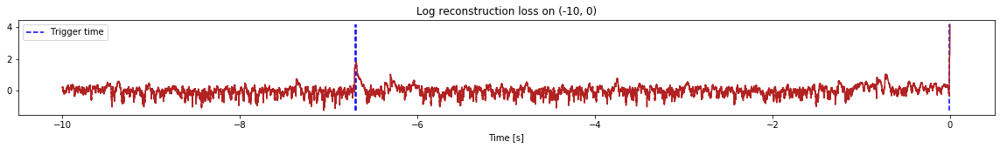

Triggered at:  [-6.6898, -0.0049]
Latent coordinates are:  [[-0.27858686, 3.632636], [-0.4957372, 2.6914203]]
<--------
Finished simulation, all the triggered times are:  [-6.6898, -0.0049]

All latent coordinate:  [[-0.27858686, 3.632636], [-0.4957372, 2.6914203]]


In [40]:
simulation("Ramp_56", "15T_data", 10,  time_range = (-50,0), reached_max = -2)

------

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (599800, 6)
Flushing input history
Number of sections: 6
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


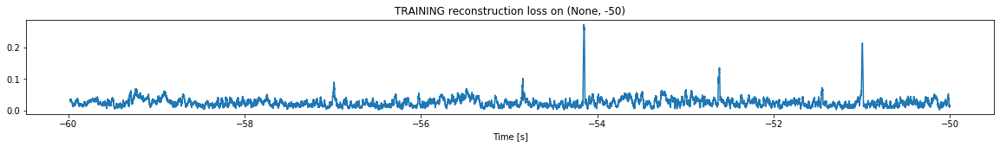

Finished training, median of the log(loss) is:  -1.6450925947775208
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


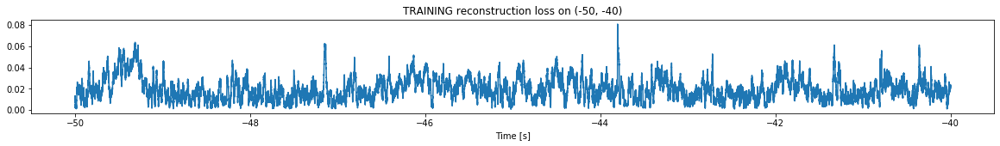

Finished training, median of the log(loss) is:  -1.7484637799022287
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6450925947775208
Triggering threshold is:  3.0


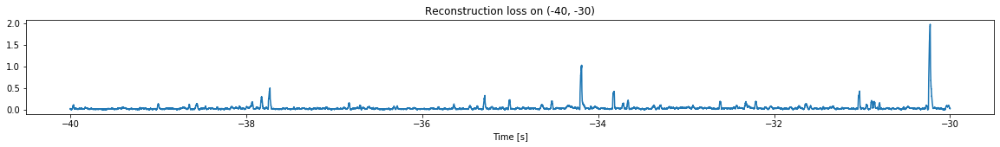

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


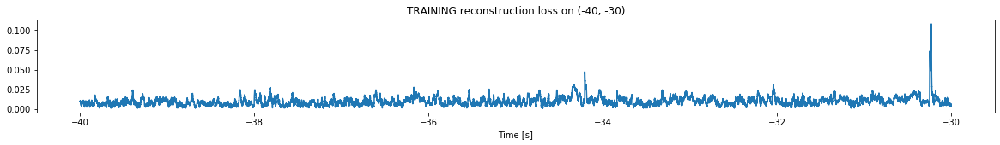

Finished training, median of the log(loss) is:  -2.0644663891473787
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7484637799022287
Triggering threshold is:  1.6


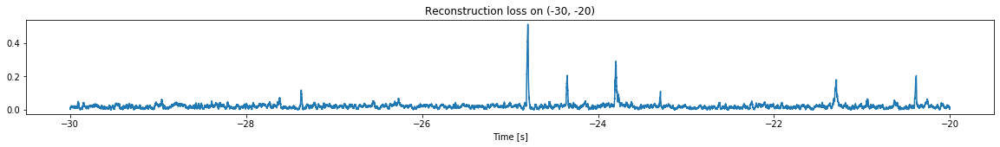

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


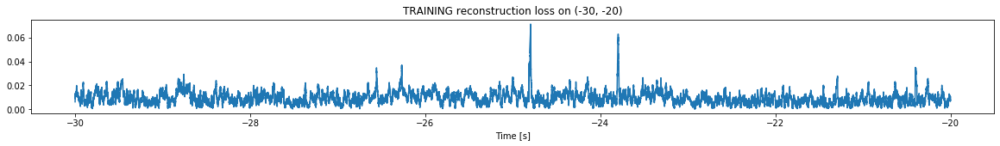

Finished training, median of the log(loss) is:  -2.046760988850864
Triggering for section:  (-20, -10)
Using this median for triggering: -2.0644663891473787
Triggering threshold is:  1.6


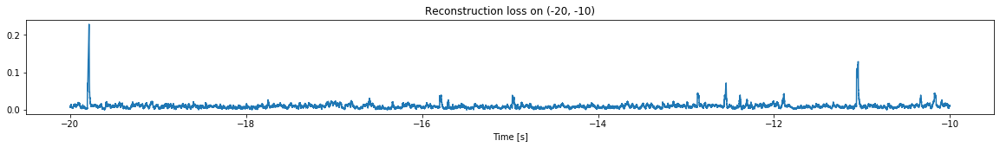

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


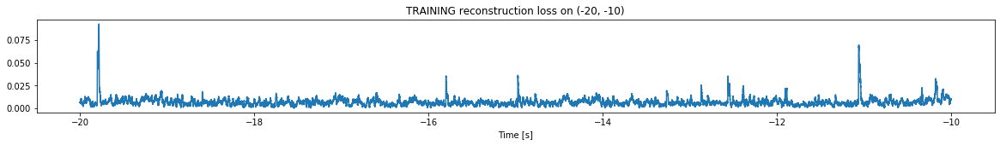

Finished training, median of the log(loss) is:  -2.200888720224657
Triggering for section:  (-10, 0)
Using this median for triggering: -2.046760988850864
Triggering threshold is:  1.6


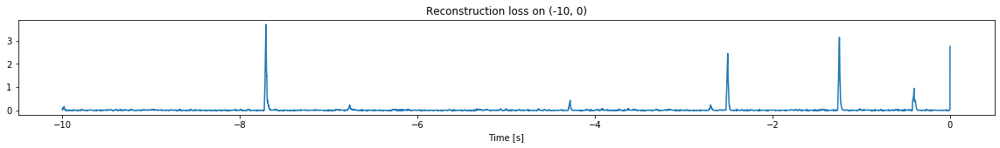

Other trigger time:  [-7.7057    -4.2788997 -2.5035    -1.2455    -0.4053   ]
Their log loss values are:  [2.61499479 1.68573498 2.43569587 2.54414202 2.02523519]


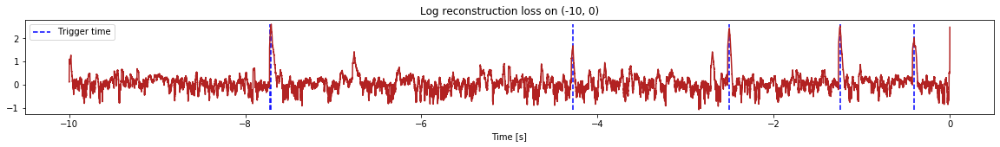

Triggered at:  [-7.7057, -4.2788997, -2.5035, -1.2455, -0.4053]
Latent coordinates are:  [[-0.99400204, -0.253825], [-0.68103164, 0.1286532], [-0.9748165, -0.112071216], [-0.98909926, -0.16999698], [-0.8384927, 0.5542967]]
<--------
Finished simulation, all the triggered times are:  [-7.7057, -4.2788997, -2.5035, -1.2455, -0.4053]

All latent coordinate:  [[-0.99400204, -0.253825], [-0.68103164, 0.1286532], [-0.9748165, -0.112071216], [-0.98909926, -0.16999698], [-0.8384927, 0.5542967]]


In [54]:
simulation("Ramp_79", "15T_data", 10,  time_range = (-60,0), reached_max = -13.7)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1129800, 6)
Flushing input history
Number of sections: 11
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 3.0, 2.7666666666666666, 2.533333333333333, 2.3, 2.066666666666667, 1.8333333333333335, 1.6]
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


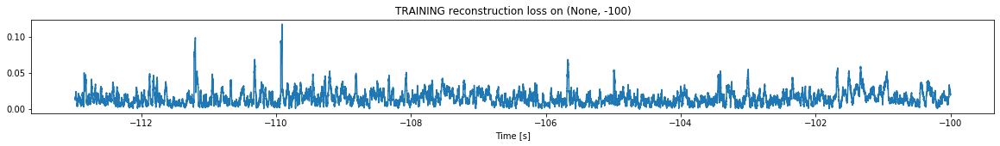

Finished training, median of the log(loss) is:  -1.8647727429018357
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


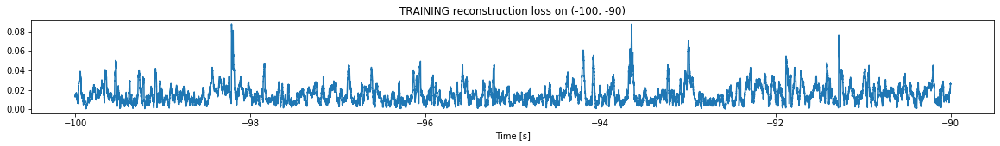

Finished training, median of the log(loss) is:  -1.8836150530931224
Triggering for section:  (-90, -80)
Using this median for triggering: -1.8647727429018357
Triggering threshold is:  3.0


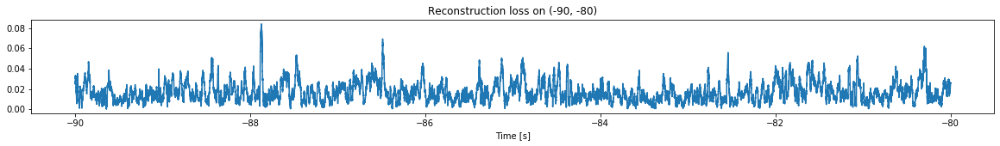

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


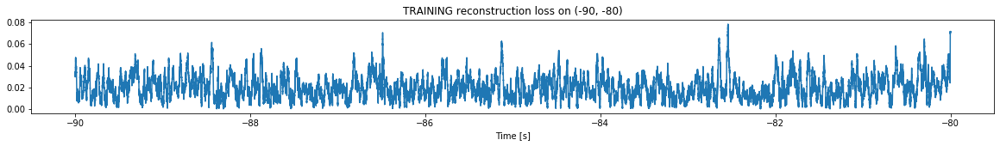

Finished training, median of the log(loss) is:  -1.7252445706876696
Triggering for section:  (-80, -70)
Using this median for triggering: -1.8836150530931224
Triggering threshold is:  2.7666666666666666


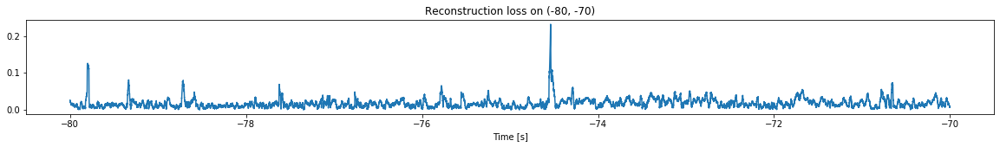

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


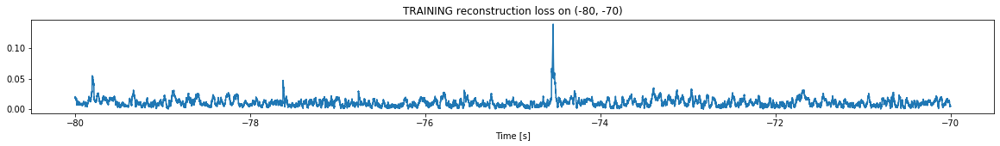

Finished training, median of the log(loss) is:  -2.030128967508463
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7252445706876696
Triggering threshold is:  2.533333333333333


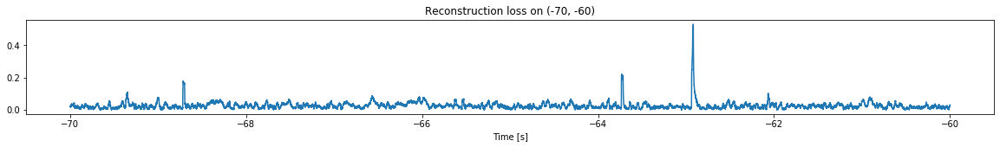

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


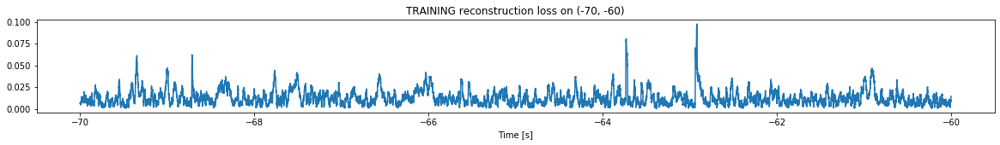

Finished training, median of the log(loss) is:  -1.9797750941073158
Triggering for section:  (-60, -50)
Using this median for triggering: -2.030128967508463
Triggering threshold is:  2.3


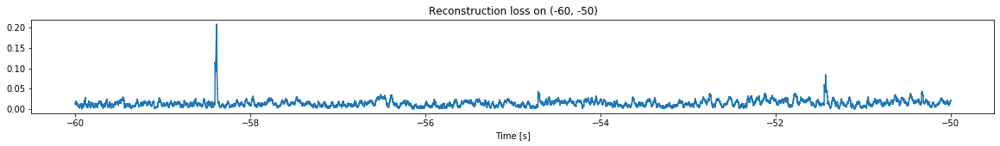

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


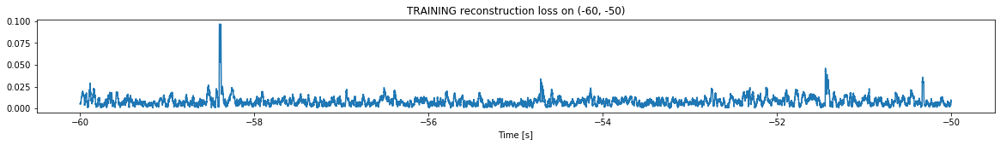

Finished training, median of the log(loss) is:  -2.1597634202081704
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9797750941073158
Triggering threshold is:  2.066666666666667


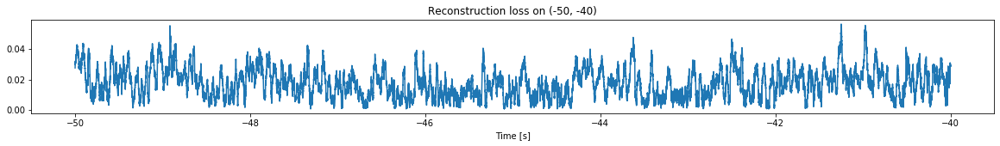

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


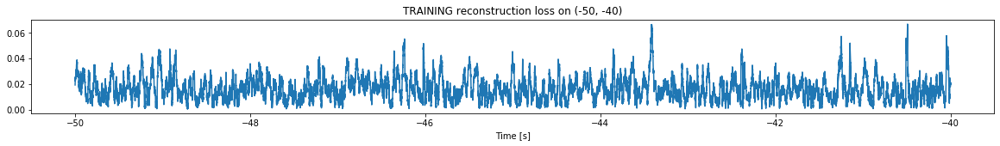

Finished training, median of the log(loss) is:  -1.8161353202868091
Triggering for section:  (-40, -30)
Using this median for triggering: -2.1597634202081704
Triggering threshold is:  1.8333333333333335


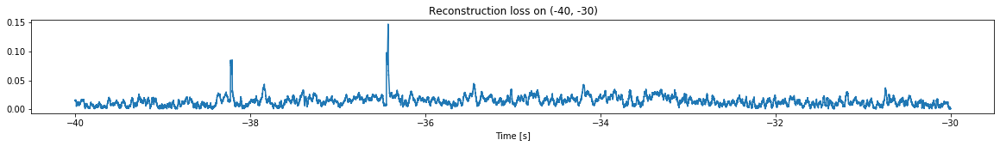

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


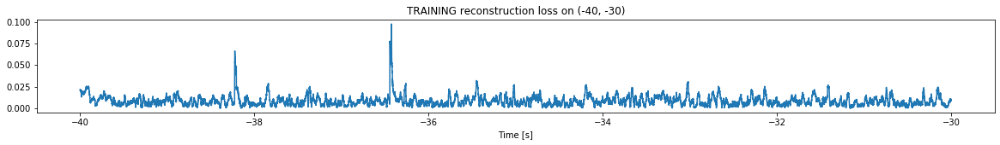

Finished training, median of the log(loss) is:  -2.123185129346168
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8161353202868091
Triggering threshold is:  1.6


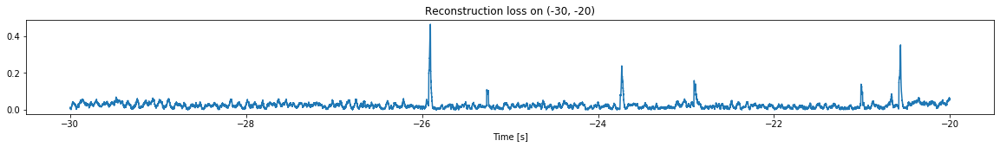

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


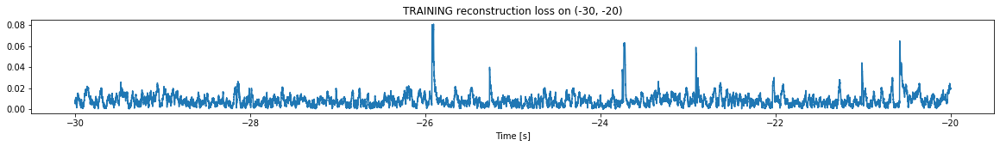

Finished training, median of the log(loss) is:  -2.1413319918521134
Triggering for section:  (-20, -10)
Using this median for triggering: -2.123185129346168
Triggering threshold is:  1.6


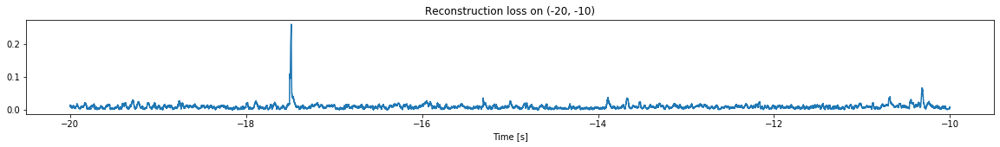

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


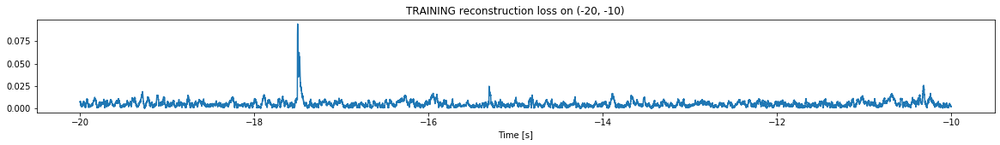

Finished training, median of the log(loss) is:  -2.3659912049120857
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1413319918521134
Triggering threshold is:  1.6


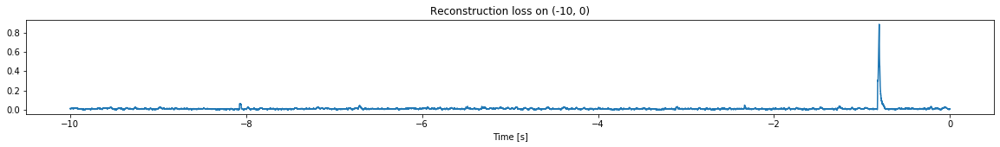

Other trigger time:  [-0.8048]
Their log loss values are:  [2.08956751]


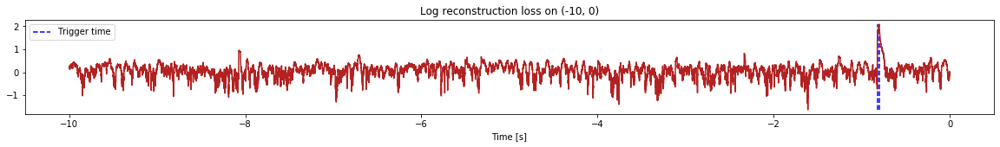

Triggered at:  [-0.8048]
Latent coordinates are:  [[4.3938985, 1.259077]]
<--------
Finished simulation, all the triggered times are:  [-0.8048]

All latent coordinate:  [[4.3938985, 1.259077]]


In [42]:
simulation("Ramp_80", "15T_data", 10,  time_range = (-113,0), reached_max = -15.9)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (299800, 6)
Flushing input history
Number of sections: 3
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-30, -20)
-------->
Entering sections:  (-20, -10)
-------->
Training for section:  (None, -20)


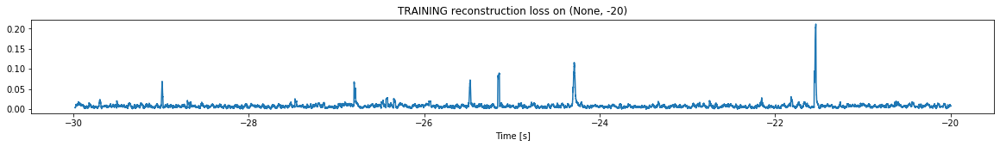

Finished training, median of the log(loss) is:  -2.1454576098927474
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


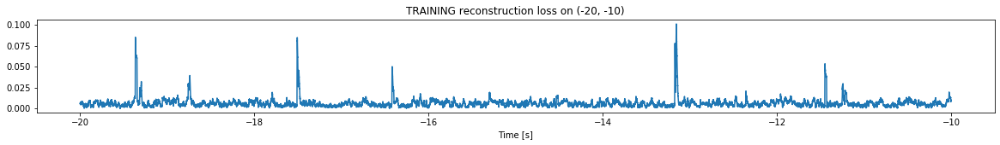

Finished training, median of the log(loss) is:  -2.2756755589686595
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1454576098927474
Triggering threshold is:  3.0


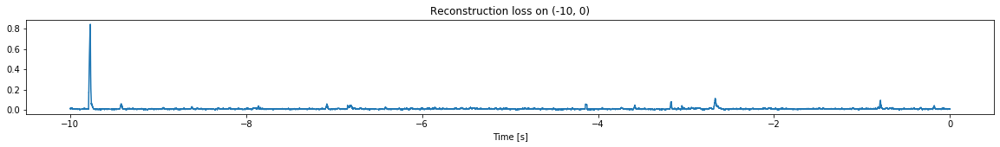

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [43]:
simulation("Ramp_81", "15T_data", 10,  time_range = (-30,0), reached_max = 16.55)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (399800, 6)
Flushing input history
Number of sections: 4
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-40, -30)
-------->
Entering sections:  (-30, -20)
-------->
Training for section:  (None, -30)


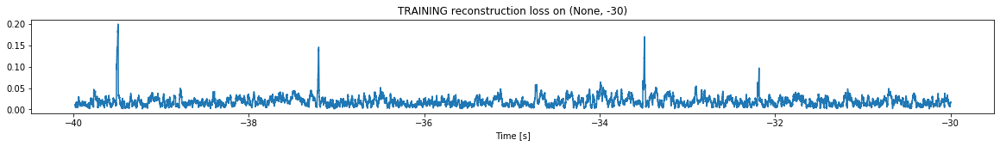

Finished training, median of the log(loss) is:  -1.7781293222876307
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


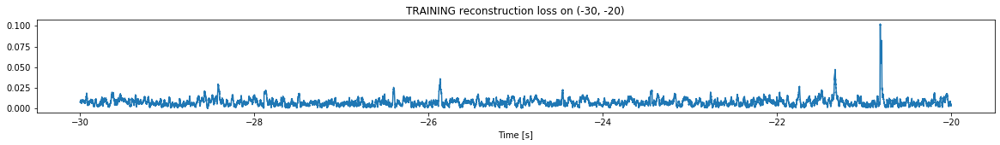

Finished training, median of the log(loss) is:  -2.1784076149046223
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7781293222876307
Triggering threshold is:  3.0


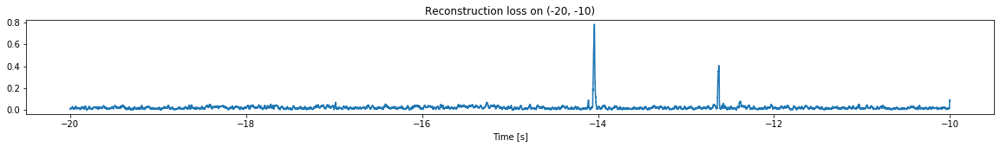

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


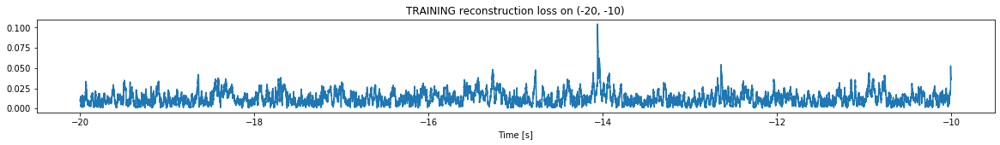

Finished training, median of the log(loss) is:  -1.9461320235906472
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1784076149046223
Triggering threshold is:  1.6


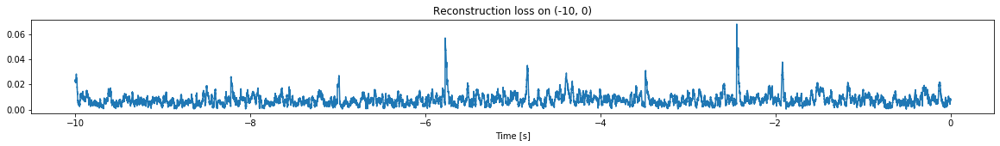

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [44]:
simulation("Ramp_82", "15T_data", 10,  time_range = (-40,0), reached_max = 2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (299800, 6)
Flushing input history
Number of sections: 3
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-30, -20)
-------->
Entering sections:  (-20, -10)
-------->
Training for section:  (None, -20)


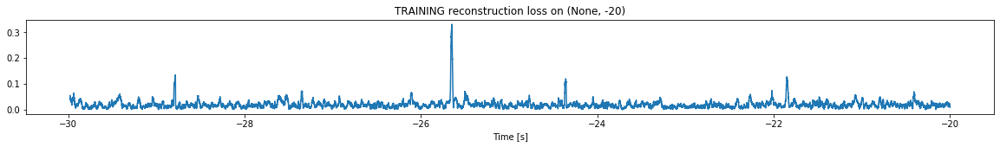

Finished training, median of the log(loss) is:  -1.7419232832285958
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


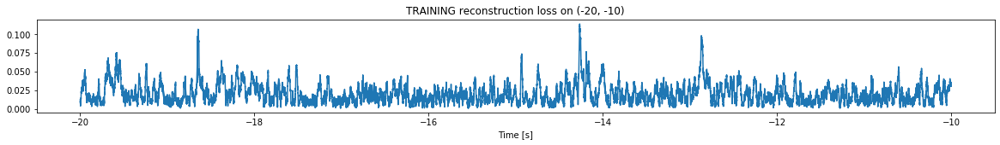

Finished training, median of the log(loss) is:  -1.7631905037658466
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7419232832285958
Triggering threshold is:  3.0


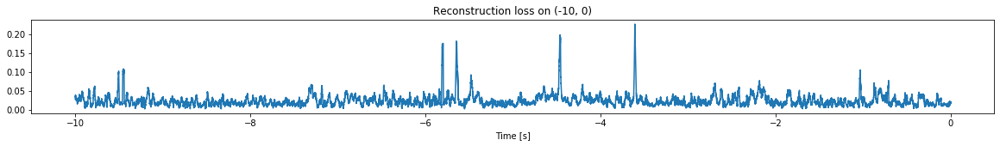

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [45]:
simulation("Ramp_84", "15T_data", 10,  time_range = (-30,0), reached_max = 21.55)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (399800, 6)
Flushing input history
Number of sections: 4
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-40, -30)
-------->
Entering sections:  (-30, -20)
-------->
Training for section:  (None, -30)


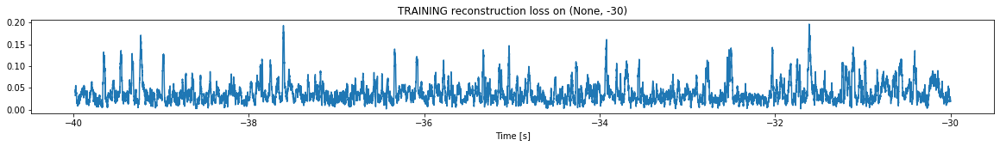

Finished training, median of the log(loss) is:  -1.4982875410452885
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


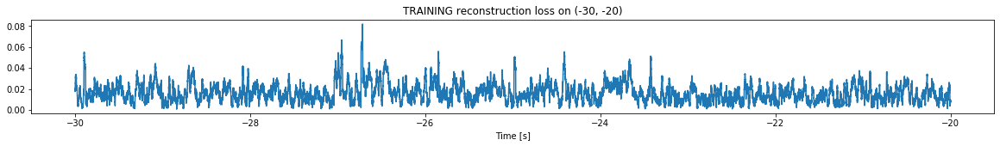

Finished training, median of the log(loss) is:  -1.8211911309335496
Triggering for section:  (-20, -10)
Using this median for triggering: -1.4982875410452885
Triggering threshold is:  3.0


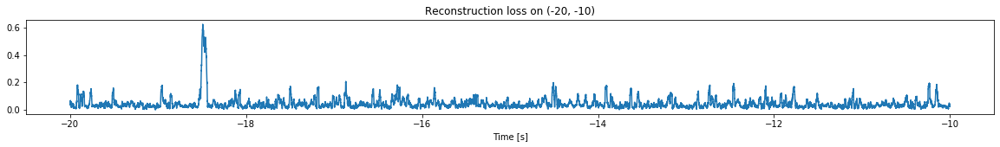

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


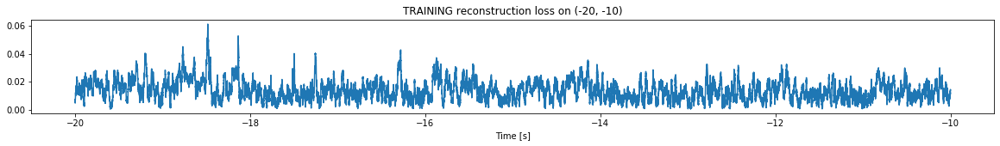

Finished training, median of the log(loss) is:  -1.8898203909143203
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8211911309335496
Triggering threshold is:  1.6


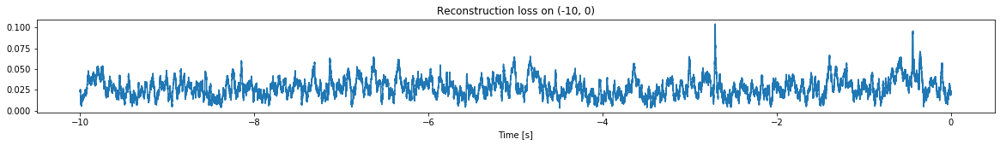

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [46]:
simulation("Ramp_85", "15T_data", 10,  time_range = (-40,0), reached_max = 9.6)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (399800, 6)
Flushing input history
Number of sections: 4
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-40, -30)
-------->
Entering sections:  (-30, -20)
-------->
Training for section:  (None, -30)


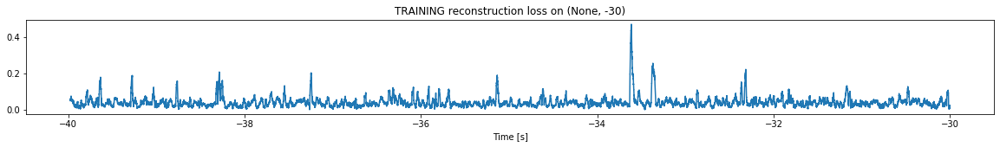

Finished training, median of the log(loss) is:  -1.4304275222305753
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


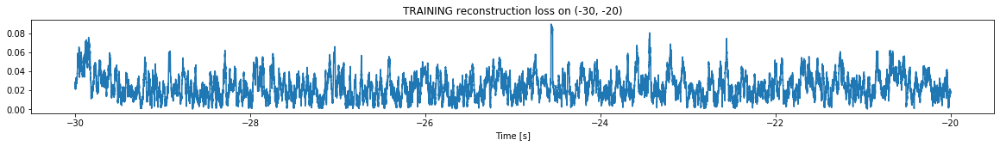

Finished training, median of the log(loss) is:  -1.6520688952138272
Triggering for section:  (-20, -10)
Using this median for triggering: -1.4304275222305753
Triggering threshold is:  3.0


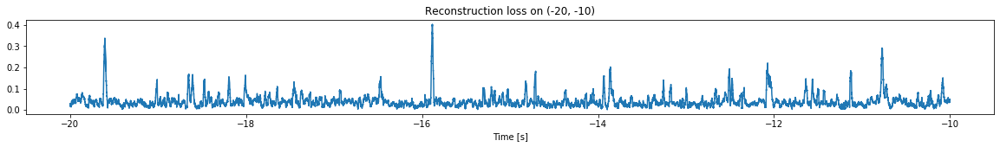

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


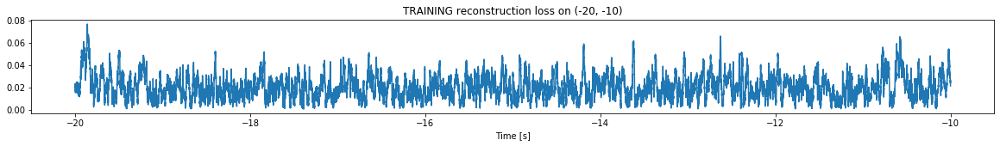

Finished training, median of the log(loss) is:  -1.722146890571066
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6520688952138272
Triggering threshold is:  1.6


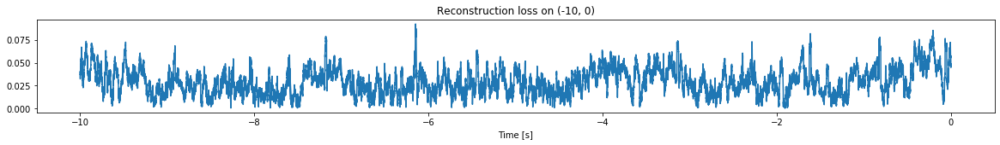

<--------
Finished simulation, all the triggered times are:  []

All latent coordinate:  []


In [47]:
simulation("Ramp_86", "15T_data", 10,  time_range = (-40,0), reached_max = 0)